# 2. Data Understanding 🌱 Crops Yield & Price Forecast | Manuel Lombardi

### 2.1 Fuentes de datos

### Resumen de fuentes de datos

| Fuente | Organismo | Cobertura temporal | Granularidad | Formato |
|---|---|---|---|---|
| Estimaciones agrícolas por campaña | Dataset real del proyecto | 1969/1970 en adelante | Anual × departamento × cultivo | CSV |
| Precios de pizarra | Cámara Arbitral de Cereales (CAC) | Serie histórica disponible | Diaria × cultivo | CSV/XLSX |
| Cotización dólar oficial (Divisa) | Errepar | Serie histórica disponible | Diaria | CSV/XLSX |
| Variables climáticas | NASA POWER (API) | 2000 en adelante | Diaria × departamento | CSV |

La unidad geográfica del análisis agrícola y climático es `Departamento`, identificado de forma robusta por `id_departamento`.


- **Precios históricos de pizarra — Soja, Maíz, Trigo y Girasol**  
  **Fuente:** Cámara Arbitral de Cereales de Rosario (CAC)  
  **Link:** https://www.cac.bcr.com.ar/es/precios-de-pizarra  
  **Cobertura temporal:** 01/01/2002 — 20/06/2026  
  **Frecuencia:** diaria (días hábiles de mercado)  
  **Formato:** Excel (.xlsx), un archivo por cultivo por período  

  Los datos se obtienen en la sección "Consultas" de la CAC, seleccionando
  el cultivo, el tipo "Precios Pizarra" y el rango de fechas. La plataforma
  limita la consulta a aproximadamente 10-11 años por descarga, por lo que
  el histórico completo de cada cultivo se obtuvo en 3 archivos consecutivos
  que luego deberán ser concatenados en la etapa de preparación de datos.

  Los registros incluyen valores **"S/C" (Sin Cotización)** para los días
  en que el mercado no operó (fines de semana, feriados, días sin
  transacciones). Estos representan aproximadamente el 37% de los registros
  en Trigo y deberán ser tratados en la fase de Data Preparation.

  > ⚠️ Los precios están expresados en **pesos argentinos por tonelada**
  > en términos nominales. La alta inflación del período analizado (2002-2026)
  > implica que será necesario deflactar la serie antes de modelar, para
  > trabajar en términos reales y garantizar comparabilidad entre períodos.

- **Estimaciones agrícolas por campaña y departamento — Girasol, Maíz, Maní, Soja (1ra y 2da) y Trigo**
  **Fuente:** Dataset real del proyecto (`estimaciones-agricolas-2026-03.csv`)
  **Cobertura temporal:** el archivo trae campañas desde 1969/1970, pero el
  análisis se restringe a partir de la **campaña 2000/2001** — límite fijado
  por la disponibilidad de NDVI de MODIS, que arranca en el año 2000 (ver
  notebook 03). La campaña más reciente presente en el archivo es 2024/2025.
  **Frecuencia:** anual (una fila por cultivo × departamento × campaña)
  **Formato:** CSV, codificación UTF-8

  Cada registro trae las siguientes variables por cultivo, departamento y campaña:

  | Variable                 | Descripción                           | Unidad    |
  |-----------------------------|----------------------------------------|-----------|
  | superficie_sembrada_ha   | Superficie sembrada                   | Hectáreas |
  | superficie_cosechada_ha  | Superficie efectivamente cosechada    | Hectáreas |
  | rendimiento_kgxha        | Rendimiento promedio por departamento | kg/Ha     |
  | produccion_tm            | Producción total estimada             | Toneladas |

  > ⚠️ El rendimiento viene en **kg/Ha**, no en quintales por hectárea (qq/Ha)
  > como en el pipeline anterior de 15 zonas PAS de la Bolsa de Cereales de
  > Buenos Aires. La conversión (qq/Ha = kg/Ha ÷ 100) y el renombrado de
  > columnas al esquema `Sembrado(Ha)` / `Cosechado(Ha)` / `Rinde(qq/Ha)` /
  > `Producción(MTn)` se hacen explícitamente en el notebook 03, porque el
  > criterio de éxito del modelo (MAE ≤ 5 qq/Ha) está definido en esa escala.
  >
  > A diferencia del pipeline anterior, este dataset reporta valores reales
  > por `departamento_id` (unidad administrativa oficial — 347 departamentos que reportan alguno de estos 6 cultivos
  > desde 2000, sobre un total de 507 departamentos en el archivo completo
  > con todos los cultivos) en lugar de promedios de 15 zonas agroeconómicas
  > aproximadas por cajas rectangulares. Esto habilita un join directo con
  > los datos climáticos y de NDVI, que ahora también están a nivel
  > departamento.
  >
  > El archivo trae además otros cultivos (ajo, arroz, poroto, yerba mate,
  > etc.) no relevantes para este proyecto — se filtra a
  > `['girasol', 'maní', 'maíz', 'soja 1ra', 'soja 2da', 'trigo total']`
  > en la sección 2.2. A diferencia del pipeline anterior, Soja 1ra y Soja
  > 2da se tratan como dos cultivos distintos (fechas de siembra y ventanas
  > fenológicas propias), en vez de usar el agregado `soja total` del
  > archivo.


- **Cotización del Dólar Oficial (Divisa) — Tipo de Cambio Comprador**  
  **Fuente:** Errepar  
  **Link:** https://www.errepar.com/cotizacion-dolar  
  **Cobertura temporal:** 11/01/2002 — 20/06/2026  
  **Frecuencia:** diaria (días hábiles bancarios)  
  **Formato:** Excel (.xlsx), descarga directa seleccionando el período y presionando "Ver datos"  

  El archivo contiene cuatro variables para cada fecha:

  | Variable       | Descripción                                              |
  |----------------|----------------------------------------------------------|
  | Billete Compra | Tipo de cambio comprador para billetes físicos           |
  | Billete Venta  | Tipo de cambio vendedor para billetes físicos            |
  | Divisa Compra  | Tipo de cambio comprador para operaciones comerciales    |
  | Divisa Venta   | Tipo de cambio vendedor para operaciones comerciales     |

  Para la conversión de precios de granos a dólares se utilizará **Divisa Compra**,
  ya que los granos son commodities de exportación: el exportador recibe dólares
  del exterior y los liquida al banco a este tipo de cambio, que es el valor
  efectivo que percibe el productor por su producción.

  > ⚠️ Los registros de los primeros meses de 2002 presentan valores **S/D
  > (Sin Dato)** en las columnas de Billete, pero mantienen datos válidos en
  > las columnas de Divisa. Esto refleja el contexto de la crisis cambiaria
  > post-convertibilidad, donde el mercado de billetes físicos operaba con
  > restricciones. Estos registros deberán ser evaluados en la fase de
  > Data Preparation.

- **NASA POWER (Prediction Of Worldwide Energy Resources)**
  **Organismo:** NASA (National Aeronautics and Space Administration)
  **URL:** https://power.larc.nasa.gov
  **Tipo de acceso:** API REST pública, gratuita, sin registro ni API key
  **Endpoint utilizado:** `/api/temporal/daily/point`
  **Cobertura temporal:** 2000 — presente (histórico descargado año a año)
  **Resolución espacial subyacente:** grilla de reanálisis de ~0.5° × 0.625°

  Los datos no provienen de estaciones meteorológicas físicas sino de modelos
  de reanálisis satelital. Son una aproximación del comportamiento climático
  real.

  **Variables solicitadas:**

  | Parámetro API   | Variable                        | Unidad  |
  |-----------------|---------------------------------|---------|
  | PRECTOTCORR     | Precipitación corregida         | mm/día  |
  | T2M             | Temperatura media a 2m          | °C      |
  | T2M_MAX         | Temperatura máxima a 2m         | °C      |
  | T2M_MIN         | Temperatura mínima a 2m         | °C      |
  | ALLSKY_SFC_SW_DWN | Radiación solar incidente     | MJ/m²/día |
  | RH2M            | Humedad relativa a 2m           | %       |

  **Estrategia de consulta:** a diferencia del pipeline anterior de 15 zonas
  PAS (que usaba el endpoint `/regional` con un bounding box por zona y
  promediaba la grilla de celdas resultante), acá se usa el endpoint
  `/point`, consultado con el **centroide** de cada uno de los 158
  departamentos (`departamentos_boxes.geojson`). El endpoint `/regional`
  exige un bounding box de al menos 2° de lado, y la mayoría de los
  departamentos son más chicos que ese mínimo, por lo que dejó de ser viable
  al bajar la resolución geográfica de zona a departamento. El endpoint
  `/point` devuelve directamente la serie de la celda de la grilla que
  contiene al centroide — un valor por día por parámetro, sin promediado
  espacial adicional de por medio. Esto elimina la limitación que tenía el
  pipeline anterior de perder la variabilidad intra-zonal (ver notebook 03).


### 2.2 Descripción de los datasets

- Descripción del dataset de Estimaciones agrícolas por campaña

- Descripción del dataset de climas por departamentos, unificados.


### Creamos la funcion auditar para optimizar la investigación de los datasets

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from statsmodels.tsa.seasonal import STL
import re

In [2]:
def auditar(df):
    """
    Function to audit a dataframe and return a summary of its characteristics.
    
    Parameters:
    df (pd.DataFrame): The dataframe to audit.
    
    Returns:
    pd.DataFrame: A summary dataframe containing the following information for each column:
        - Column Name
        - Data Type
        - Number of Missing Values
        - Percentage of Missing Values
        - Number of Unique Values
        - Number of Duplicated Values
        - Top Value (most frequent)
        - Frequency of Top Value
    """
    
    # Create an empty list to store the summary information
    summary = []
    
    # Iterate through each column in the dataframe
    for col in df.columns:
        # Get the data type of the column
        dtype = df[col].dtype
        
        # Calculate the number of missing values
        missing_values = df[col].isnull().sum()
        
        # Calculate the percentage of missing values
        missing_percentage = (missing_values / len(df)) * 100
        
        # Calculate the number of unique values
        unique_values = df[col].nunique()
        
        # Get the top value and its frequency
        top_value = df[col].mode()[0] if not df[col].mode().empty else None
        top_value_freq = df[col].value_counts().iloc[0] if not df[col].value_counts().empty else None
        
        # Append the information to the summary list
        summary.append({
            'Column Name': col,
            'Data Type': dtype,
            'Missing Values': missing_values,
            'Missing Percentage': missing_percentage,
            'Unique Values': unique_values,
            'Duplicated Values': df[col].duplicated().sum(),
            'Top Value': top_value,
            'Top Value Frequency': top_value_freq
        })
    
    # Convert the summary list to a dataframe
    summary_df = pd.DataFrame(summary)
    
    return summary_df

### Carga y lectura de archivos de clima y concatenación en una sola tabla

In [3]:
from pathlib import Path

clima_dir = Path("../data/raw/clima_departamentos")
dfs_clima = []
for file_path in sorted(clima_dir.glob("clima_*.csv")):
    file_id = file_path.stem.removeprefix("clima_")
    temp_df = pd.read_csv(file_path, index_col=0, parse_dates=True)
    temp_df.index.name = "Fecha"
    temp_df = temp_df.reset_index()
    temp_df["Departamento_id"] = temp_df["Departamento_id"].astype("string").str.zfill(5)
    if temp_df["Departamento_id"].dropna().ne(file_id).any():
        raise ValueError(f"ID inconsistente en {file_path.name}")
    temp_df["archivo_clima"] = file_path.name
    dfs_clima.append(temp_df)

if not dfs_clima:
    raise FileNotFoundError(f"No se encontraron archivos clima_*.csv en {clima_dir.resolve()}")

df_clima = pd.concat(dfs_clima, ignore_index=True)
print(f"Archivos climáticos cargados: {len(dfs_clima)}")
print(f"Departamentos climáticos: {df_clima['Departamento_id'].nunique()}")
df_clima.head(10)

Archivos climáticos cargados: 158
Departamentos climáticos: 158


,Fecha,PRECTOTCORR,T2M,T2M_MAX,T2M_MIN,ALLSKY_SFC_SW_DWN,RH2M,Departamento,Departamento_id,archivo_clima
0,2000-01-01,0.00,26.95,34.32,18.72,28.63,50.32,Adolfo Alsina,06007,clima_06007.csv
1,2000-01-02,0.68,27.08,33.92,20.60,26.45,49.47,Adolfo Alsina,06007,clima_06007.csv
2,2000-01-03,0.07,25.50,33.15,17.20,29.35,43.37,Adolfo Alsina,06007,clima_06007.csv
3,2000-01-04,0.56,25.99,33.10,18.50,26.76,50.99,Adolfo Alsina,06007,clima_06007.csv
4,2000-01-05,0.00,26.18,33.27,19.41,32.98,42.45,Adolfo Alsina,06007,clima_06007.csv
5,2000-01-06,7.82,23.67,29.83,16.31,24.99,53.32,Adolfo Alsina,06007,clima_06007.csv
6,2000-01-07,15.38,22.62,26.34,19.29,23.89,78.02,Adolfo Alsina,06007,clima_06007.csv
7,2000-01-08,2.61,21.57,27.78,17.52,28.79,67.99,Adolfo Alsina,06007,clima_06007.csv
8,2000-01-09,0.74,23.31,30.65,14.58,31.75,60.87,Adolfo Alsina,06007,clima_06007.csv
9,2000-01-10,0.00,25.01,31.88,17.83,33.63,53.17,Adolfo Alsina,06007,clima_06007.csv


### Carga y lectura de datos de campañas 

In [4]:
df_camp = pd.read_csv(
    "../data/raw/estimaciones-agricolas-2026-03.csv",
    dtype={"departamento_id": "string", "provincia_id": "string"}
)

columnas_numericas = [
    "superficie_sembrada_ha",
    "superficie_cosechada_ha",
    "produccion_tm",
    "rendimiento_kgxha",
]
for columna in columnas_numericas:
    df_camp[columna] = pd.to_numeric(df_camp[columna], errors="coerce")

df_camp["departamento_id"] = df_camp["departamento_id"].str.zfill(5)
df_camp["cultivo"] = df_camp["cultivo"].astype("string").str.strip().str.lower()
cultivos_analizados = ["girasol", "maní", "maíz", "soja 1ra", "soja 2da", "trigo total"]
df_camp = df_camp[df_camp["cultivo"].isin(cultivos_analizados)].copy()

anio_minimo = 2000
filas_antes_filtro_anio = len(df_camp)
df_camp = df_camp[df_camp["anio"] >= anio_minimo].copy()
print(f"Filas descartadas por anio < {anio_minimo} (límite de disponibilidad de NDVI MODIS): "
      f"{filas_antes_filtro_anio - len(df_camp)}")

df_camp["superficie_perdida_ha"] = df_camp["superficie_sembrada_ha"] - df_camp["superficie_cosechada_ha"]

clave_agricola = ["departamento_id", "campania", "cultivo"]
duplicados_clave = df_camp[df_camp.duplicated(clave_agricola, keep=False)].sort_values(clave_agricola)
print(f"Registros agrícolas analizados: {len(df_camp)}")
print(f"Departamentos agrícolas: {df_camp['departamento_id'].nunique()}")
print(f"Cultivos agrícolas analizados: {sorted(df_camp['cultivo'].dropna().unique())}")
print(f"Duplicados de la clave {clave_agricola}: {len(duplicados_clave)}")
df_camp.head(5)


Filas descartadas por anio < 2000 (límite de disponibilidad de NDVI MODIS): 25396
Registros agrícolas analizados: 29885
Departamentos agrícolas: 347
Cultivos agrícolas analizados: ['girasol', 'maní', 'maíz', 'soja 1ra', 'soja 2da', 'trigo total']
Duplicados de la clave ['departamento_id', 'campania', 'cultivo']: 0


,cultivo,anio,campania,provincia,provincia_id,departamento,departamento_id,superficie_sembrada_ha,superficie_cosechada_ha,produccion_tm,rendimiento_kgxha,superficie_perdida_ha
57916,girasol,2000,2000/2001,Buenos Aires,06,Guaminí,06399,27500,27400,46000,1679,100
57917,girasol,2000,2000/2001,Buenos Aires,06,General Villegas,06392,22950,21450,48700,2270,1500
57918,girasol,2000,2000/2001,Buenos Aires,06,General Viamonte,06385,4500,4000,8800,2200,500
57919,girasol,2000,2000/2001,Buenos Aires,06,Bolívar,06105,1000,1000,1600,1600,0
57920,girasol,2000,2000/2001,Buenos Aires,06,9 de Julio,06588,3000,3000,5400,1800,0


In [5]:
df_camp.head(5)

,cultivo,anio,campania,provincia,provincia_id,departamento,departamento_id,superficie_sembrada_ha,superficie_cosechada_ha,produccion_tm,rendimiento_kgxha,superficie_perdida_ha
57916,girasol,2000,2000/2001,Buenos Aires,06,Guaminí,06399,27500,27400,46000,1679,100
57917,girasol,2000,2000/2001,Buenos Aires,06,General Villegas,06392,22950,21450,48700,2270,1500
57918,girasol,2000,2000/2001,Buenos Aires,06,General Viamonte,06385,4500,4000,8800,2200,500
57919,girasol,2000,2000/2001,Buenos Aires,06,Bolívar,06105,1000,1000,1600,1600,0
57920,girasol,2000,2000/2001,Buenos Aires,06,9 de Julio,06588,3000,3000,5400,1800,0


In [6]:
ids_agricolas = set(df_camp["departamento_id"].dropna().astype(str))
ids_climaticos = set(df_clima["Departamento_id"].dropna().astype(str))
ids_sin_clima = sorted(ids_agricolas - ids_climaticos)
ids_sin_agricultura = sorted(ids_climaticos - ids_agricolas)
print(f"IDs agrícolas: {len(ids_agricolas)}")
print(f"IDs climáticos: {len(ids_climaticos)}")
print(f"Departamentos con ambas fuentes: {len(ids_agricolas & ids_climaticos)}")
print(f"Departamentos agrícolas sin clima: {len(ids_sin_clima)}")
print(f"Departamentos climáticos sin agricultura: {len(ids_sin_agricultura)}")
print(f"Filas climáticas duplicadas por ID y fecha: {df_clima.duplicated(['Departamento_id', 'Fecha']).sum()}")
mapa_departamentos = df_clima[["Departamento_id", "Departamento"]].drop_duplicates().set_index("Departamento_id")["Departamento"].to_dict()
df_camp["departamento_clima"] = df_camp["departamento_id"].map(mapa_departamentos)
departamentos_nombre_inconsistente = df_camp[df_camp["departamento_clima"].notna() & (df_camp["departamento"] != df_camp["departamento_clima"])]
print(f"Nombres inconsistentes para un mismo ID: {len(departamentos_nombre_inconsistente)}")

IDs agrícolas: 347


IDs climáticos: 158
Departamentos con ambas fuentes: 157
Departamentos agrícolas sin clima: 190
Departamentos climáticos sin agricultura: 1
Filas climáticas duplicadas por ID y fecha: 0


Nombres inconsistentes para un mismo ID: 216


**Cobertura cruzada agrícola/climática:** de los 347 departamentos con al menos un registro agrícola de los 6 cultivos analizados (2000–2024), solo 158 tienen datos climáticos descargados — 190 departamentos agrícolas se quedan sin clima. En sentido inverso, de los 158 departamentos climáticos, 157 tienen agricultura registrada para estos 6 cultivos; el restante no siembra ninguno de los 6 en el período analizado. Esta brecha es intencional: el clima y el NDVI solo se descargaron para los 158 departamentos que concentran ~95% de la superficie sembrada nacional de estos cultivos (el filtro se aplica y se documenta con el gráfico de cobertura acumulada en el notebook 03) — no tendría sentido pagar el costo de descarga de NASA POWER/MODIS para departamentos marginales.

Los "nombres inconsistentes para un mismo ID" (216 filas) se reducen, al deduplicar por `departamento_id`, a solo **2 departamentos** con una variante de nombre distinta entre el archivo agrícola y el climático (`Villa Constitución` vs. `Constitución`, id 82028; `Juan F. Ibarra` vs. `Juan Felipe Ibarra`, id 86098). En ambos casos es la misma unidad geográfica con un nombre abreviado en una de las dos fuentes — el `departamento_id` es consistente, así que no afecta ningún join posterior.


### Carga y lectura de datos de precios históricos del Dólar Divisa Compra

In [7]:
df_dolard = pd.read_excel(r"..\data\raw\cotizaciones_dolar.xlsx")
df_dolard.head()

,Fecha,Billete Compra,Billete Venta,Divisa Compra,Divisa Venta
0,2026-08-19,1465,1515,1488.0,1497
1,2026-08-18,1465,1515,1486.0,1495
2,2026-08-17,1460,1510,1478.5,1487.5
3,2026-08-16,1460,1510,1478.5,1487.5
4,2026-08-15,1460,1510,1478.5,1487.5


Como podemos ver, hay otras columnas pero solo nos interesa la de 'Divisa Compra'. Procedemos a filtrar el DataFrame para quedarnos con esa columna

In [8]:
df_dolard = df_dolard[['Fecha', 'Divisa Compra']]
df_dolard.head()

,Fecha,Divisa Compra
0,2026-08-19,1488.0
1,2026-08-18,1486.0
2,2026-08-17,1478.5
3,2026-08-16,1478.5
4,2026-08-15,1478.5


#### Carga y lectura de los datasets de precios de cultivos

In [9]:
# Lee y concatena archivos dentro de cada subcarpeta de la ruta dada.
base_path = r"..\data\raw\precios_cultivos"

dfs_precios = {}
for folder in sorted(os.listdir(base_path)):
    folder_path = os.path.join(base_path, folder)
    if not os.path.isdir(folder_path):
        continue

    parts = []
    for fname in sorted(os.listdir(folder_path)):
        fpath = os.path.join(folder_path, fname)
        if fname.lower().endswith(".csv"):
            try:
                parts.append(pd.read_csv(fpath))
            except Exception as e:
                print(f"Error leyendo {fpath}: {e}")
        elif fname.lower().endswith((".xlsx", ".xls")):
            try:
                parts.append(pd.read_excel(fpath))
            except Exception as e:
                print(f"Error leyendo {fpath}: {e}")
        else:
            # omitir otros formatos
            continue

    df_concat = pd.concat(parts, ignore_index=True) if parts else pd.DataFrame()
    dfs_precios[folder] = df_concat

    # crear variable global con nombre seguro: df_precios_<folder_sanitizado>
    var_name = "df_precios_" + "".join(ch if ch.isalnum() else "_" for ch in folder)
    globals()[var_name] = df_concat

    print(f"{folder} -> filas: {len(df_concat)} ; variable: {var_name}")

# Resultado: diccionario `dfs_precios` con un dataframe por carpeta
# y variables globales `df_precios_<nombre_carpeta>` disponibles en el notebook.

precios_girasol -> filas: 6000 ; variable: df_precios_precios_girasol
precios_maiz -> filas: 6000 ; variable: df_precios_precios_maiz


precios_soja -> filas: 6000 ; variable: df_precios_precios_soja
precios_trigo -> filas: 6000 ; variable: df_precios_precios_trigo


In [10]:
for key, val in dfs_precios.items():
    print(f"DataFrame: {key}")
    print(val.head())
    print("-"*50)

DataFrame: precios_girasol
  Fecha de operación Precio
0         2002-01-02    S/C
1         2002-01-11    S/C
2         2002-01-14    S/C
3         2002-01-15    S/C
4         2002-01-16    S/C
--------------------------------------------------
DataFrame: precios_maiz
  Fecha de operación Precio
0         2002-01-02    S/C
1         2002-01-11    S/C
2         2002-01-14    S/C
3         2002-01-15    S/C
4         2002-01-16    S/C
--------------------------------------------------
DataFrame: precios_soja
  Fecha de operación Precio
0         2002-01-02    S/C
1         2002-01-11    S/C
2         2002-01-14    S/C
3         2002-01-15    S/C
4         2002-01-16    S/C
--------------------------------------------------
DataFrame: precios_trigo
  Fecha de operación Precio
0         2002-01-02    S/C
1         2002-01-11    S/C
2         2002-01-14    S/C
3         2002-01-15    S/C
4         2002-01-16    S/C
--------------------------------------------------


Leemos todos los precios de los 4 cultivos, los concatenamos y creamos un dataframe para cada cultivo. A simple vista ya podemos ver que hay que realizar una limpieza de datos ya que los días donde no hay precios, se marca como S/C (Sin Cotización).

#### Audición de datos de campañas

In [11]:
df_camp = df_camp.copy()
audicion_camp = auditar(df_camp)
for key, value in audicion_camp.iterrows():
    print(f"Column: {value['Column Name']} | Data Type: {value['Data Type']} | Missing: {value['Missing Values']} ({value['Missing Percentage']:.2f}%) | Unique: {value['Unique Values']} | Duplicated: {value['Duplicated Values']} | Top Value: {value['Top Value']} (Frequency: {value['Top Value Frequency']})")
    print("-" * 130)

Column: cultivo | Data Type: string | Missing: 0 (0.00%) | Unique: 6 | Duplicated: 29879 | Top Value: maíz (Frequency: 7171)
----------------------------------------------------------------------------------------------------------------------------------
Column: anio | Data Type: int64 | Missing: 0 (0.00%) | Unique: 25 | Duplicated: 29860 | Top Value: 2024 (Frequency: 1372)
----------------------------------------------------------------------------------------------------------------------------------
Column: campania | Data Type: object | Missing: 0 (0.00%) | Unique: 25 | Duplicated: 29860 | Top Value: 2024/2025 (Frequency: 1372)
----------------------------------------------------------------------------------------------------------------------------------
Column: provincia | Data Type: object | Missing: 0 (0.00%) | Unique: 15 | Duplicated: 29870 | Top Value: Buenos Aires (Frequency: 11888)
-------------------------------------------------------------------------------------------

#### 📝 Diccionario de Datos: Dataset Agrícola

A continuación se detallan las variables que componen el conjunto de datos, luego del filtro de cultivos, campañas y columnas derivadas aplicado en la carga (2.1):

| Columna | Descripción | Unidad de Medida |
| :--- | :--- | :--- |
| **cultivo** | Cultivo sembrado: girasol, maíz, maní, soja 1ra, soja 2da o trigo total. | Texto (Categoría) |
| **anio** | Año de inicio de la campaña. | Año |
| **campania** | Ciclo agrícola de producción, formato bienal (ej. 2024/2025). | Año / Ciclo |
| **provincia** / **provincia_id** | Provincia y su código oficial. | Texto / Código |
| **departamento** / **departamento_id** | Departamento y su código oficial (georef-ar), unidad geográfica del análisis. | Texto / Código |
| **superficie_sembrada_ha** | Superficie total implantada con el cultivo. | Hectáreas (ha) |
| **superficie_cosechada_ha** | Superficie efectivamente cosechada al final del ciclo. | Hectáreas (ha) |
| **superficie_perdida_ha** | Diferencia entre sembrado y cosechado (columna derivada; el archivo original no la trae). | Hectáreas (ha) |
| **produccion_tm** | Volumen total de grano recolectado. | Toneladas |
| **rendimiento_kgxha** | Rendimiento promedio obtenido por unidad de superficie. | kg/Ha |

---


La frecuencia de los datos es anual (por campaña), agrupados por departamento y cultivo. Esto permite observar y analizar la producción, rendimiento y superficie trabajada de cada cultivo en las distintas campañas, a nivel de cada uno de los 158 departamentos analizados.


Audición de datos climáticos

In [12]:
audicion_clima = auditar(df_clima)
for key, value in audicion_clima.iterrows():
    print(f"Column: {value['Column Name']} | Data Type: {value['Data Type']} | Missing: {value['Missing Values']} ({value['Missing Percentage']:.2f}%) | Unique: {value['Unique Values']} | Duplicated: {value['Duplicated Values']} | Top Value: {value['Top Value']} (Frequency: {value['Top Value Frequency']})")
    print("-" * 130)

Column: Fecha | Data Type: datetime64[ns] | Missing: 0 (0.00%) | Unique: 9743 | Duplicated: 1529396 | Top Value: 2000-01-01 00:00:00 (Frequency: 158)
----------------------------------------------------------------------------------------------------------------------------------
Column: PRECTOTCORR | Data Type: float64 | Missing: 481 (0.03%) | Unique: 7879 | Duplicated: 1531259 | Top Value: 0.0 (Frequency: 783665)
----------------------------------------------------------------------------------------------------------------------------------
Column: T2M | Data Type: float64 | Missing: 481 (0.03%) | Unique: 3898 | Duplicated: 1535240 | Top Value: 20.22 (Frequency: 840)
----------------------------------------------------------------------------------------------------------------------------------
Column: T2M_MAX | Data Type: float64 | Missing: 481 (0.03%) | Unique: 4333 | Duplicated: 1534805 | Top Value: 24.44 (Frequency: 776)
---------------------------------------------------------

#### Diccionario de Datos: Dataset Climático

A continuación se detallan las variables que componen el conjunto de datos, especificando su descripción técnica y unidades de medida correspondientes:

| Columna | Descripción | Unidad de Medida |
| :--- | :--- | :--- |
| **Fecha** | Día al que corresponden los valores de la fila, expresado en formato YYYY/MM/DD | Diario |
| **PRECTOTCORR** | Precipitación total corregida. | mm/Día |
| **T2M** | Temperatura del aire a 2 metros de altura sobre la superficie | °C valor medio |
| **T2M_MAX** | Temperatura máxima del aire a 2 metros. | °C |
| **T2M_MIN** | Temperatura mínima del aire a 2 metros. | °C |
| **ALLSKY_SFC_SW_DWN** | Irradiancia descendente de onda corta en la superficie. | MJ/m²/día |
| **RH2M** | Humedad relativa a 2 metros de altura. | Pct. % |
| **Departamento** | Nombre del departamento (unidad geográfica del análisis, no zona PAS). | Texto (Categoría) |
| **Departamento_id** | Código oficial del departamento (georef-ar). | Código |

---


#### Audición de precios del Dólar Divisa Compra

In [13]:
audicion_dolar = auditar(df_dolard)
for key, value in audicion_dolar.iterrows():
    print(f"Column: {value['Column Name']} | Data Type: {value['Data Type']} | Missing: {value['Missing Values']} ({value['Missing Percentage']:.2f}%) | Unique: {value['Unique Values']} | Duplicated: {value['Duplicated Values']} | Top Value: {value['Top Value']} (Frequency: {value['Top Value Frequency']})")
    print("-" * 130)

Column: Fecha | Data Type: datetime64[ns] | Missing: 0 (0.00%) | Unique: 7384 | Duplicated: 0 | Top Value: 2002-01-11 00:00:00 (Frequency: 1)
----------------------------------------------------------------------------------------------------------------------------------
Column: Divisa Compra | Data Type: float64 | Missing: 0 (0.00%) | Unique: 3667 | Duplicated: 3717 | Top Value: 348.95 (Frequency: 41)
----------------------------------------------------------------------------------------------------------------------------------


### Diccionario de Datos: Dataset Cotizaciones del Dólar Divisa Compra

A continuación se detallan las variables que componen el conjunto de datos, especificando su descripción técnica y unidades de medida correspondientes:

| Columna | Descripción | Unidad de Medida |
| :--- | :--- | :--- |
| **Fecha** | Día al que corresponden los valores de la fila, expresado en formato YYYY/MM/DD | Diario |
| **Divisa Compra** | Cotización del Dólar Divisa Compra en esa fecha. | Pesos Argentinos (ARS) |
---


#### Audición de precios de los cultivos

In [14]:
audiciones = {}
for key, val in dfs_precios.items():
    audiciones[key] = auditar(val)
    

In [15]:
for key, val in audiciones.items():
    print("-"*64 + f" AUDICIÓN PARA {key} " + "-"*64)
    for key2, value in val.iterrows():
        print(f"Column: {value['Column Name']} | Data Type: {value['Data Type']} | Missing: {value['Missing Values']} ({value['Missing Percentage']:.2f}%) | Unique: {value['Unique Values']} | Duplicated: {value['Duplicated Values']} | Top Value: {value['Top Value']} (Frequency: {value['Top Value Frequency']})")
        
    print("=" * 159)

---------------------------------------------------------------- AUDICIÓN PARA precios_girasol ----------------------------------------------------------------
Column: Fecha de operación | Data Type: datetime64[ns] | Missing: 0 (0.00%) | Unique: 6000 | Duplicated: 0 | Top Value: 2002-01-02 00:00:00 (Frequency: 1)
Column: Precio | Data Type: object | Missing: 0 (0.00%) | Unique: 939 | Duplicated: 5061 | Top Value: S/C (Frequency: 3388)
---------------------------------------------------------------- AUDICIÓN PARA precios_maiz ----------------------------------------------------------------
Column: Fecha de operación | Data Type: datetime64[ns] | Missing: 0 (0.00%) | Unique: 6000 | Duplicated: 0 | Top Value: 2002-01-02 00:00:00 (Frequency: 1)
Column: Precio | Data Type: object | Missing: 0 (0.00%) | Unique: 2460 | Duplicated: 3540 | Top Value: S/C (Frequency: 1249)
---------------------------------------------------------------- AUDICIÓN PARA precios_soja --------------------------------

### Diccionario de Datos: Dataset Cotizaciones de Cultivos

A continuación se detallan las variables que componen el conjunto de datos, especificando su descripción técnica y unidades de medida correspondientes:

| Columna | Descripción | Unidad de Medida |
| :--- | :--- | :--- |
| **Fecha** | Día al que corresponden los valores de la fila, expresado en formato YYYY/MM/DD | Diario |
| **Precio** | Cotización del cultivo en esa fecha. | Pesos Argentinos (ARS) |
---


### 2.3 Calidad de los datos
- Valores nulos por columna

In [16]:
audicion_camp[['Column Name', 'Missing Values','Missing Percentage']]


,Column Name,Missing Values,Missing Percentage
0,cultivo,0,0.000000
1,anio,0,0.000000
2,campania,0,0.000000
3,provincia,0,0.000000
4,provincia_id,0,0.000000
5,departamento,0,0.000000
6,departamento_id,0,0.000000
7,superficie_sembrada_ha,0,0.000000
8,superficie_cosechada_ha,0,0.000000
9,produccion_tm,0,0.000000


Se observa en el dataset agrícola que no hay valores nulos en ninguna de las columnas. Procederemos a analizar los duplicados por cada columna.

In [17]:
audicion_clima[['Column Name', 'Missing Values','Missing Percentage']]

,Column Name,Missing Values,Missing Percentage
0,Fecha,0,0.000000
1,PRECTOTCORR,481,0.031251
2,T2M,481,0.031251
3,T2M_MAX,481,0.031251
4,T2M_MIN,481,0.031251
5,ALLSKY_SFC_SW_DWN,995,0.064647
6,RH2M,481,0.031251
7,Departamento,0,0.000000
8,Departamento_id,0,0.000000
9,archivo_clima,0,0.000000


Luego de pasar el DataFrame de climas por la función observamos que solo una columna posee valores faltantes, pero hay un detalle y es que la API cuando no posee datos de un día, envía valores de todas maneras pero con el valor -999.0. Por lo tanto procederemos a buscar esos valores en las columnas y sumarlos a estos valores analizados.

In [18]:
cuenta = {}
columnas_clima = [
    col for col in df_clima.columns
    if col not in ["Fecha", "Departamento", "Departamento_id", "archivo_clima"]
]
for col in columnas_clima:
    cuenta[col] = (df_clima[col] == -999.0).sum()
    print(f"Columna: {col} | Valores inválidos: {cuenta[col]}")

Columna: PRECTOTCORR | Valores inválidos: 0
Columna: T2M | Valores inválidos: 0
Columna: T2M_MAX | Valores inválidos: 0
Columna: T2M_MIN | Valores inválidos: 0
Columna: ALLSKY_SFC_SW_DWN | Valores inválidos: 0
Columna: RH2M | Valores inválidos: 0


In [19]:
audicion_clima['Missing Values'] = (
    audicion_clima['Missing Values'] +
    audicion_clima['Column Name'].map(cuenta).fillna(0)
)

audicion_clima['Missing Percentage'] = (
    (audicion_clima['Missing Values'] / len(df_clima)) * 100
)

audicion_clima[['Column Name', 'Missing Values', 'Missing Percentage']]

,Column Name,Missing Values,Missing Percentage
0,Fecha,0.0,0.000000
1,PRECTOTCORR,481.0,0.031251
2,T2M,481.0,0.031251
3,T2M_MAX,481.0,0.031251
4,T2M_MIN,481.0,0.031251
5,ALLSKY_SFC_SW_DWN,995.0,0.064647
6,RH2M,481.0,0.031251
7,Departamento,0.0,0.000000
8,Departamento_id,0.0,0.000000
9,archivo_clima,0.0,0.000000


Ahora si, aunque la cantidad se prácticamente mínima, hay valores nulos en 6 de las 8 columnas. Se deberá tener en cuenta esta información para análisis posteriores.

In [20]:
audicion_dolar[['Column Name', 'Missing Values', 'Missing Percentage']]

,Column Name,Missing Values,Missing Percentage
0,Fecha,0,0.0
1,Divisa Compra,0,0.0


- Valores duplicados

In [21]:
audicion_clima[['Column Name', 'Duplicated Values']]

,Column Name,Duplicated Values
0,Fecha,1529396
1,PRECTOTCORR,1531259
2,T2M,1535240
3,T2M_MAX,1534805
4,T2M_MIN,1535502
5,ALLSKY_SFC_SW_DWN,1535660
6,RH2M,1531122
7,Departamento,1538992
8,Departamento_id,1538981
9,archivo_clima,1538981


Como se observa hay muchos valores duplicados en todas las columnas pero a continuación entenderemos el por qué:

- En la columna Fecha, se debe a que esta tabla fue construida a partir de la union de tablas que contenían datos climáticos diarios de las distintas zonas desde 1981 aproximadamente, por lo tanto se repiten fechas entre las 15 zonas.

- En la columna Zona, la dupliación de valores se da porque para cada tabla de cada zona, se agregó una columna con el nombre de la zona a la que pertenece, para poder distinguirla a la hora de crear la tabla con todas las zonas.

- Las demás columnas, puede ser coincidencia de que se hayan registrados los mismos valores o como vimos anteriormente, que haya registros con el valor -999.0, el cual en pasos posteriores veremnos que decisión se toma en cuanto a su limpieza.

In [22]:
audicion_camp[['Column Name', 'Duplicated Values']]

,Column Name,Duplicated Values
0,cultivo,29879
1,anio,29860
2,campania,29860
3,provincia,29870
4,provincia_id,29870
5,departamento,29586
6,departamento_id,29538
7,superficie_sembrada_ha,23847
8,superficie_cosechada_ha,22264
9,produccion_tm,16288


Podemos ver que hay valores duplicados en todas las columnas, pero entenderemos el contexto de cada columna para justificar estos duplicados:
- 'Campaña': Las campañas se repiten ya que para cada zona, se cargaron los datos de todas las campañas. Son aproximadamente 20 campañas para 15 zonas distintas.
- 'Zona': Similar a la explicación de la columna anterior, cada zona se repite en cada campaña donde se trabajó.
- 'Cultivo': Los cultivos se sembraron en más de una campaña, en más de una zona, lo que hace que aparezca el mismo cultivo varias veces.
- 'Sembrado': La cantidad del cultivo sembrado puede aparecer duplicado al darse la coincidencia de que se haya sembrado la misma cantidad de hectáres en varios lugares, no representa una inconsistencia ni problema.
- 'Perdido': Igual a la explicación de la columna anterior, se puede dar la coincidencia de que se pierda lo mismo en más de un lugar.
- 'Cosechado': Igual a la explicación de la columna anterior, se puede dar la coincidencia de que se coseche lo mismo en más de un lugar.
- 'Rinde': Igual a la explicación de la columna anterior, se puede dar la coincidencia de que el rinde sea igual en más de un lugar
- 'Producción': Igual a la explicación de la columna anterior, se puede dar la coincidencia de que las toneladas producidas sean similares en más de un lugar.

In [23]:
audicion_dolar[['Column Name', 'Duplicated Values']]

,Column Name,Duplicated Values
0,Fecha,0
1,Divisa Compra,3717


Observamos que en Fecha no hay valores duplicados lo cual es correcto pero en Divisa Compra si las hay. Esto se debe a que la cotización de un día puede ser la misma que otro y esto no es un error ni un problema que haya que tratar. Se deja tal cual está.

- Inconsistencias (ej. campañas con datos faltantes por zona, datos climáticos erróneos)

In [24]:
"""### 2.6 Exploración temporal

- Evolución del rendimiento por departamento, cultivo y campaña.
- Estacionalidad y tendencia en los precios.
- Identificación de campañas atípicas y eventos climáticos.
"""

'### 2.6 Exploración temporal\n\n- Evolución del rendimiento por departamento, cultivo y campaña.\n- Estacionalidad y tendencia en los precios.\n- Identificación de campañas atípicas y eventos climáticos.\n'

Podemos observar que los valores nulos en la columna ALLSKY_SFC_SW_DWN se deben a que hay información a partir del 1/1/1984, por lo tanto los años anteriores no poseen información para esta variable. 

In [25]:
df_clima[df_clima['PRECTOTCORR']==-999.0]

,Fecha,PRECTOTCORR,T2M,T2M_MAX,T2M_MIN,ALLSKY_SFC_SW_DWN,RH2M,Departamento,Departamento_id,archivo_clima


Todos estos valores están en todas las columnas ya que no se posee información para los primeros días de Julio (momento donde se hizo la recolección de datos) por lo tanto los primeros días de este mes serán ignorados a la hora de entrenar los modelos.

In [26]:
df_camp[df_camp['superficie_sembrada_ha']<= 0]

,cultivo,anio,campania,provincia,provincia_id,departamento,departamento_id,superficie_sembrada_ha,superficie_cosechada_ha,produccion_tm,rendimiento_kgxha,superficie_perdida_ha,departamento_clima
109457,soja 1ra,2008,2008/2009,La Pampa,42,Toay,42140,0,0,0,0,0,Toay
111229,soja 1ra,2014,2014/2015,Jujuy,38,El Carmen,38014,0,120,324,2700,-120,NaN
158047,trigo total,2022,2022/2023,Chaco,22,San Fernando,22140,0,0,0,0,0,NaN
158200,trigo total,2022,2022/2023,Jujuy,38,Dr. Manuel Belgrano,38021,0,0,0,0,0,NaN
158238,trigo total,2022,2022/2023,Jujuy,38,Ledesma,38035,0,0,0,0,0,NaN


In [27]:
df_camp[df_camp['superficie_cosechada_ha']<= 0]

,cultivo,anio,campania,provincia,provincia_id,departamento,departamento_id,superficie_sembrada_ha,superficie_cosechada_ha,produccion_tm,rendimiento_kgxha,superficie_perdida_ha,departamento_clima
57944,girasol,2000,2000/2001,Buenos Aires,06,Coronel de Marina Leonardo Rosales,06182,1500,0,0,0,1500,NaN
60423,girasol,2013,2013/2014,Entre Ríos,30,Victoria,30105,100,0,0,0,100,Victoria
60555,girasol,2014,2014/2015,Córdoba,14,San Justo,14140,1900,0,0,0,1900,San Justo
60925,girasol,2016,2016/2017,Entre Ríos,30,Victoria,30105,75,0,0,0,75,Victoria
61731,girasol,2021,2021/2022,Chaco,22,General Güemes,22063,600,0,0,0,600,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
157616,trigo total,2020,2020/2021,Chaco,22,Libertador General San Martín,22084,300,0,0,0,300,NaN
157795,trigo total,2021,2021/2022,Chaco,22,Libertador General San Martín,22084,300,0,0,0,300,NaN
158047,trigo total,2022,2022/2023,Chaco,22,San Fernando,22140,0,0,0,0,0,NaN
158200,trigo total,2022,2022/2023,Jujuy,38,Dr. Manuel Belgrano,38021,0,0,0,0,0,NaN


In [28]:
df_camp[df_camp['rendimiento_kgxha']<= 0]

,cultivo,anio,campania,provincia,provincia_id,departamento,departamento_id,superficie_sembrada_ha,superficie_cosechada_ha,produccion_tm,rendimiento_kgxha,superficie_perdida_ha,departamento_clima
57944,girasol,2000,2000/2001,Buenos Aires,06,Coronel de Marina Leonardo Rosales,06182,1500,0,0,0,1500,NaN
59131,girasol,2006,2006/2007,La Pampa,42,Hucal,42077,100,100,0,0,0,NaN
60423,girasol,2013,2013/2014,Entre Ríos,30,Victoria,30105,100,0,0,0,100,Victoria
60555,girasol,2014,2014/2015,Córdoba,14,San Justo,14140,1900,0,0,0,1900,San Justo
60925,girasol,2016,2016/2017,Entre Ríos,30,Victoria,30105,75,0,0,0,75,Victoria
...,...,...,...,...,...,...,...,...,...,...,...,...,...
158238,trigo total,2022,2022/2023,Jujuy,38,Ledesma,38035,0,0,0,0,0,NaN
158329,trigo total,2023,2023/2024,Tucumán,90,Yerba Buena,90119,50,50,0,0,0,NaN
158411,trigo total,2023,2023/2024,Tucumán,90,Lules,90063,400,400,0,0,0,NaN
158420,trigo total,2023,2023/2024,Tucumán,90,Famaillá,90028,300,300,0,0,0,NaN


In [29]:
df_camp[df_camp['produccion_tm']<= 0]

,cultivo,anio,campania,provincia,provincia_id,departamento,departamento_id,superficie_sembrada_ha,superficie_cosechada_ha,produccion_tm,rendimiento_kgxha,superficie_perdida_ha,departamento_clima
57944,girasol,2000,2000/2001,Buenos Aires,06,Coronel de Marina Leonardo Rosales,06182,1500,0,0,0,1500,NaN
59131,girasol,2006,2006/2007,La Pampa,42,Hucal,42077,100,100,0,0,0,NaN
60423,girasol,2013,2013/2014,Entre Ríos,30,Victoria,30105,100,0,0,0,100,Victoria
60555,girasol,2014,2014/2015,Córdoba,14,San Justo,14140,1900,0,0,0,1900,San Justo
60925,girasol,2016,2016/2017,Entre Ríos,30,Victoria,30105,75,0,0,0,75,Victoria
...,...,...,...,...,...,...,...,...,...,...,...,...,...
158238,trigo total,2022,2022/2023,Jujuy,38,Ledesma,38035,0,0,0,0,0,NaN
158329,trigo total,2023,2023/2024,Tucumán,90,Yerba Buena,90119,50,50,0,0,0,NaN
158411,trigo total,2023,2023/2024,Tucumán,90,Lules,90063,400,400,0,0,0,NaN
158420,trigo total,2023,2023/2024,Tucumán,90,Famaillá,90028,300,300,0,0,0,NaN


A simple vista podemos observar valores atípicos (outliers) que en la mayoría de los casos son inconsistencias de datos. Estos valores son todos los registros donde lo sembrado, cosechado, el rendimiento o las toneladas producidas son 0, ya que no tiene sentido que se haya sembrado pero no se haya cosechado y aun así hay toneladas producidas en ese registro. Si bien es posible que debido a un incendio, helada u otro desastre natural se pierda gran porcentaje de lo sembrado, hay casos como el mencionado anteriormente que no tienen sentido. La campaña más reciente que trae el archivo es 2024/2025, y no muestra señales de estar incompleta: de hecho es la campaña con más registros de las últimas seis (1.372), así que no se descarta por eso.


In [30]:
condicion = (df_camp["superficie_sembrada_ha"] - df_camp["superficie_perdida_ha"]) == df_camp["superficie_cosechada_ha"]

cumplen = condicion.sum()
no_cumplen = (~condicion).sum()

print(f"Cumplen: {cumplen} ({(cumplen / len(df_camp)) * 100:.2f}%)")
print(f"No cumplen: {no_cumplen} ({(no_cumplen / len(df_camp)) * 100:.2f}%)")
df_no_cumplen = df_camp[~condicion]
df_no_cumplen

Cumplen: 29885 (100.00%)
No cumplen: 0 (0.00%)


,cultivo,anio,campania,provincia,provincia_id,departamento,departamento_id,superficie_sembrada_ha,superficie_cosechada_ha,produccion_tm,rendimiento_kgxha,superficie_perdida_ha,departamento_clima


A diferencia del pipeline anterior, acá `superficie_perdida_ha` no es una columna que traiga el archivo original: se calculó en la carga (2.1) como `superficie_sembrada_ha - superficie_cosechada_ha`. Por eso el chequeo de consistencia da **100% de los registros cumpliendo** — es una identidad algebraica por construcción (`sembrada - (sembrada - cosechada) = cosechada`, siempre), no una validación cruzada contra un dato reportado de forma independiente como en el dataset de 15 zonas PAS (que sí traía Sembrado, Perdido y Cosechado como tres columnas separadas, reportadas por la fuente y no derivadas). El chequeo se conserva por consistencia con el notebook anterior, pero no aporta información nueva; lo que sí sería una inconsistencia real de datos es que `superficie_perdida_ha` diera negativa (cosechado mayor a sembrado), algo que no se verificó en esta celda.


In [31]:
df_dolard['Divisa Compra'] = (
    df_dolard['Divisa Compra']
    .astype(str)
    .str.replace(r'[^0-9\-,.]', '', regex=True)
    .str.replace(',', '.', regex=False)
)
df_dolard['Divisa Compra'] = pd.to_numeric(df_dolard['Divisa Compra'], errors='coerce')

print("Valores no convertidos a numérico:", df_dolard['Divisa Compra'].isna().sum())
df_dolard.head()

Valores no convertidos a numérico: 0


,Fecha,Divisa Compra
0,2026-08-19,1488.0
1,2026-08-18,1486.0
2,2026-08-17,1478.5
3,2026-08-16,1478.5
4,2026-08-15,1478.5


In [32]:
df_dolard['Divisa Compra'].astype(float)
df_dolard[df_dolard['Divisa Compra'] < 0]

,Fecha,Divisa Compra


Convertimos la columna a float ya que era tipo object y comprobamos que no haya valores menores a 0 ya que sería ilógico. Como podemos ver, no hay ninguno.

In [33]:
for key, df_price in dfs_precios.items():
    # Normalizar nombres de columna
    df_price.columns = df_price.columns.str.strip()

    if 'Precio ' in df_price.columns:
        df_price.rename(columns={'Precio ': 'Precio'}, inplace=True)

    if 'Fecha de operación' in df_price.columns:
        df_price['Fecha de operación'] = pd.to_datetime(
            df_price['Fecha de operación'],
            errors='coerce'
        ).dt.date

    if 'Precio' in df_price.columns:
        df_price['Precio'] = df_price['Precio'].replace('S/C', np.nan)
        df_price['Precio'] = pd.to_numeric(df_price['Precio'], errors='coerce')
        df_price['Precio'] = df_price['Precio'].ffill().bfill()
        dfs_precios[key]['Precio'].astype(float)

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\2226261462.py:15: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_price['Precio'] = df_price['Precio'].replace('S/C', np.nan)
C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\2226261462.py:15: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_price['Precio'] = df_price['Precio'].replace('S/C', np.nan)
C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\2226261462.py:15: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed i

Lo que se hizo en esta sección fue convertir la columna Fecha de cada DataFrame a una fecha sola ya que también contaba con la hora y por otro lado lo que se hizo fue llenar los días donde el mercado no cotizó con el valor siguiente (ffill) o el anterior (bfill), dependiendo el caso. Por ejemplo, habia datasets que comenzaban históricamente con S/C, por lo tanto no se podia hacer un ffill, por eso se hizo primero un ffill y luego un bfill para poder llenar los valores más viejos. Por último se cambió el tipo de dato a float para poder trabajar de una mejor manera. Con esto completamos la limpieza de datos necesarias para poder trabajar con estos datasets.

In [34]:
for key in dfs_precios.keys():
    print(f"DataFrame: {key}")
    print(dfs_precios[key].head())
    print("-"*50)

DataFrame: precios_girasol
  Fecha de operación  Precio
0         2002-01-02   250.0
1         2002-01-11   250.0
2         2002-01-14   250.0
3         2002-01-15   250.0
4         2002-01-16   250.0
--------------------------------------------------
DataFrame: precios_maiz
  Fecha de operación  Precio
0         2002-01-02   115.0
1         2002-01-11   115.0
2         2002-01-14   115.0
3         2002-01-15   115.0
4         2002-01-16   115.0
--------------------------------------------------
DataFrame: precios_soja
  Fecha de operación  Precio
0         2002-01-02   230.0
1         2002-01-11   230.0
2         2002-01-14   230.0
3         2002-01-15   230.0
4         2002-01-16   230.0
--------------------------------------------------
DataFrame: precios_trigo
  Fecha de operación  Precio
0         2002-01-02   133.2
1         2002-01-11   133.2
2         2002-01-14   133.2
3         2002-01-15   133.2
4         2002-01-16   133.2
--------------------------------------------------


### 2.4 Exploración univariada

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


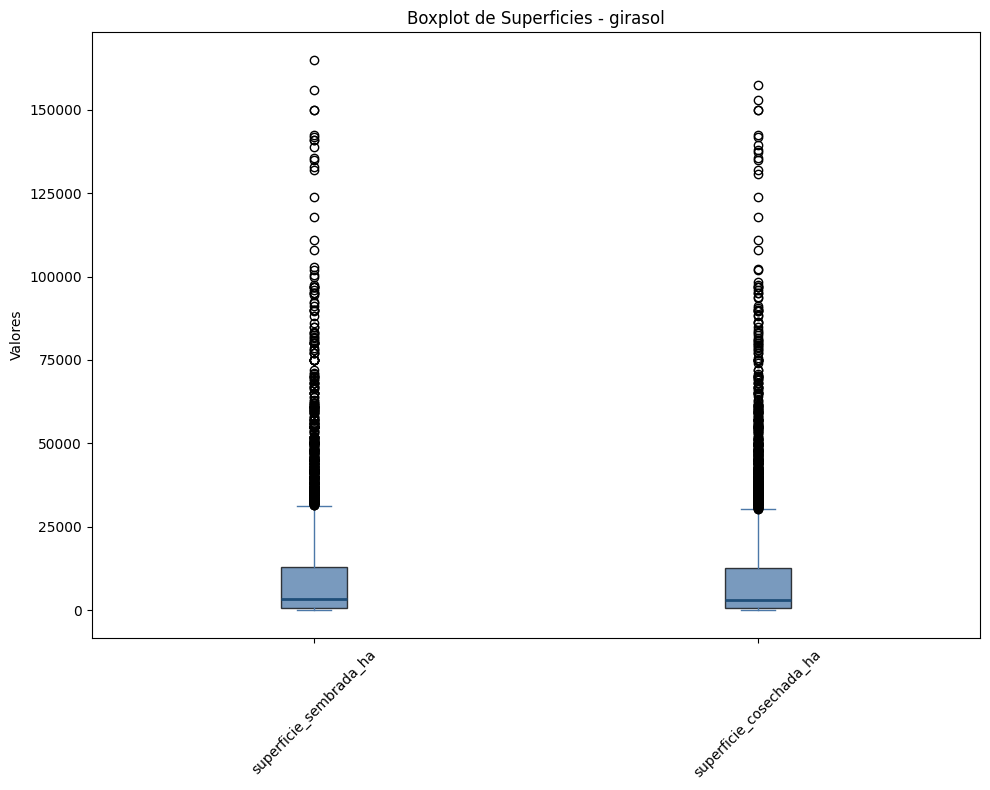

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


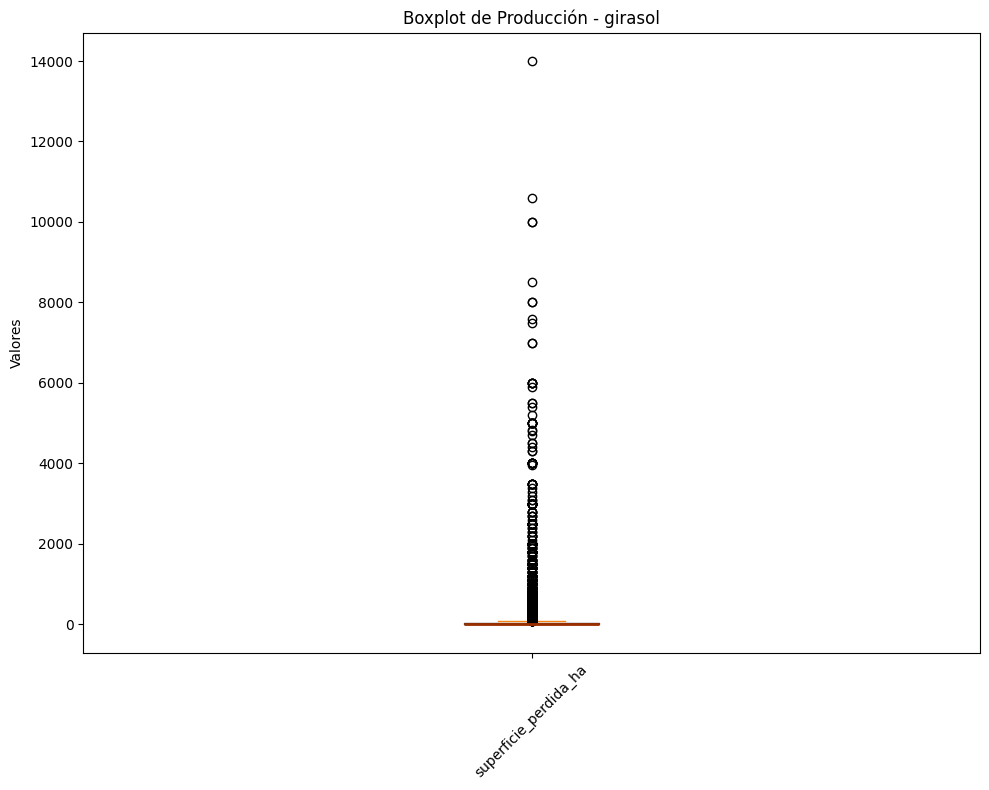

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


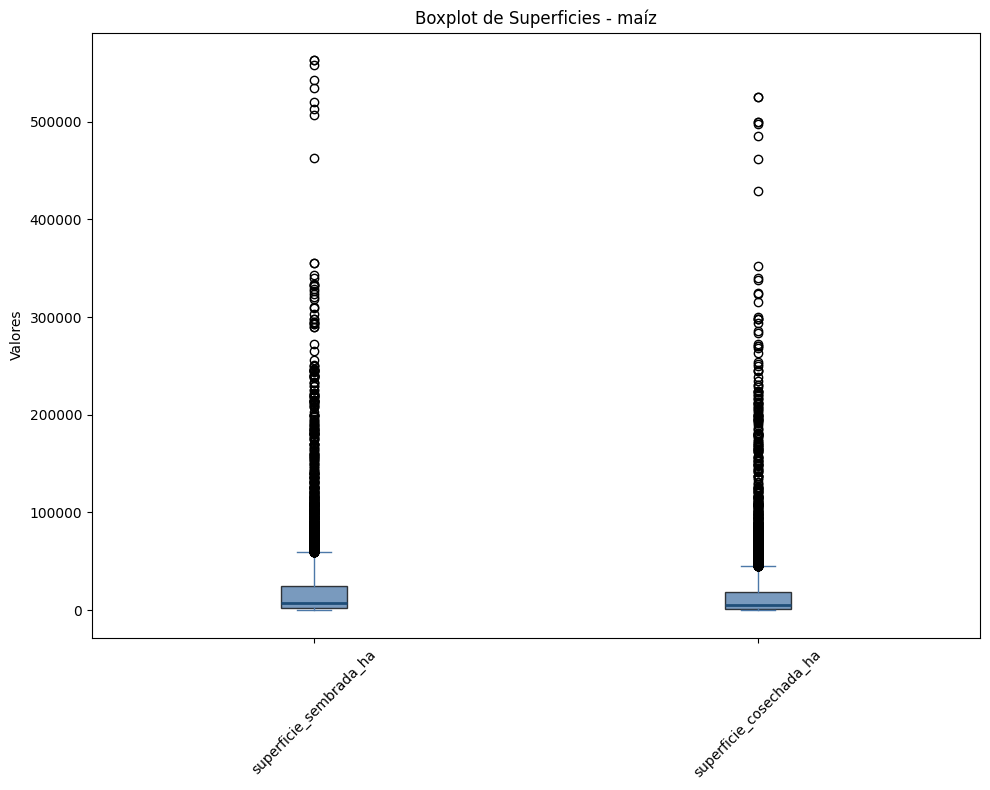

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


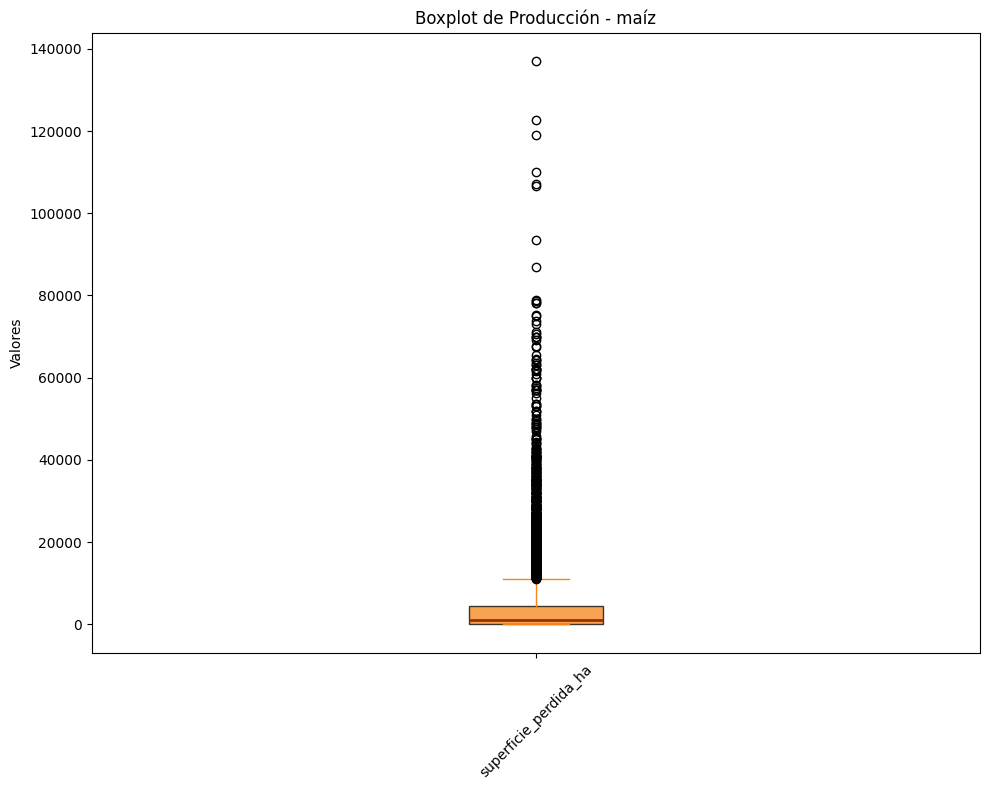

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


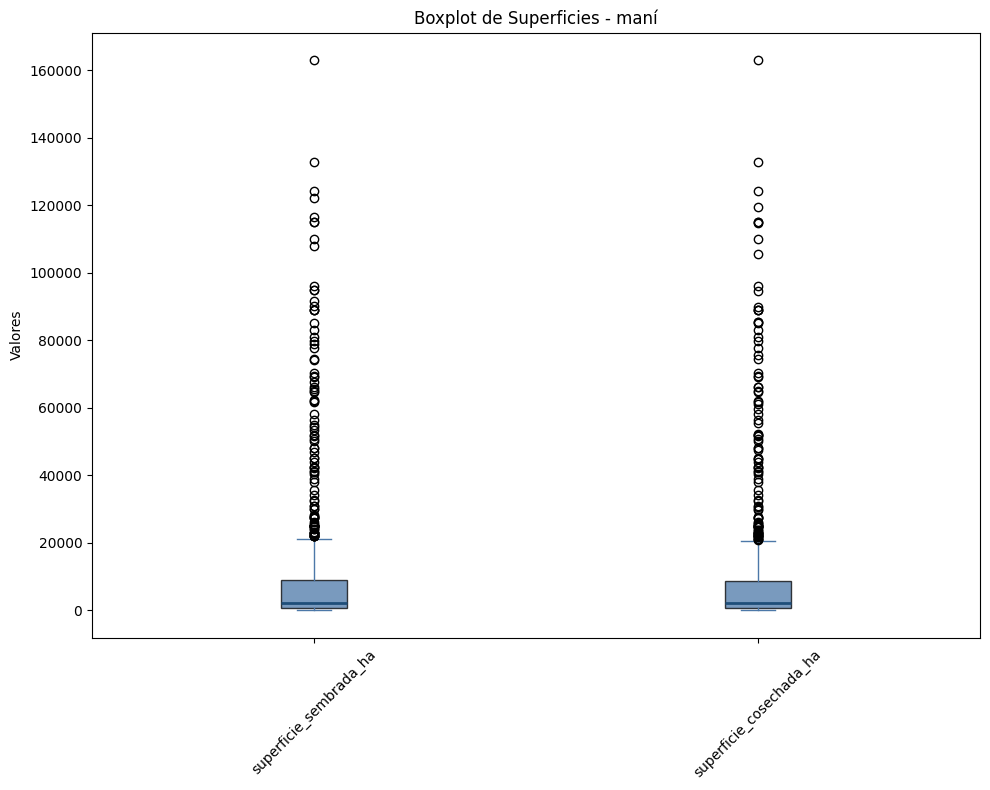

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


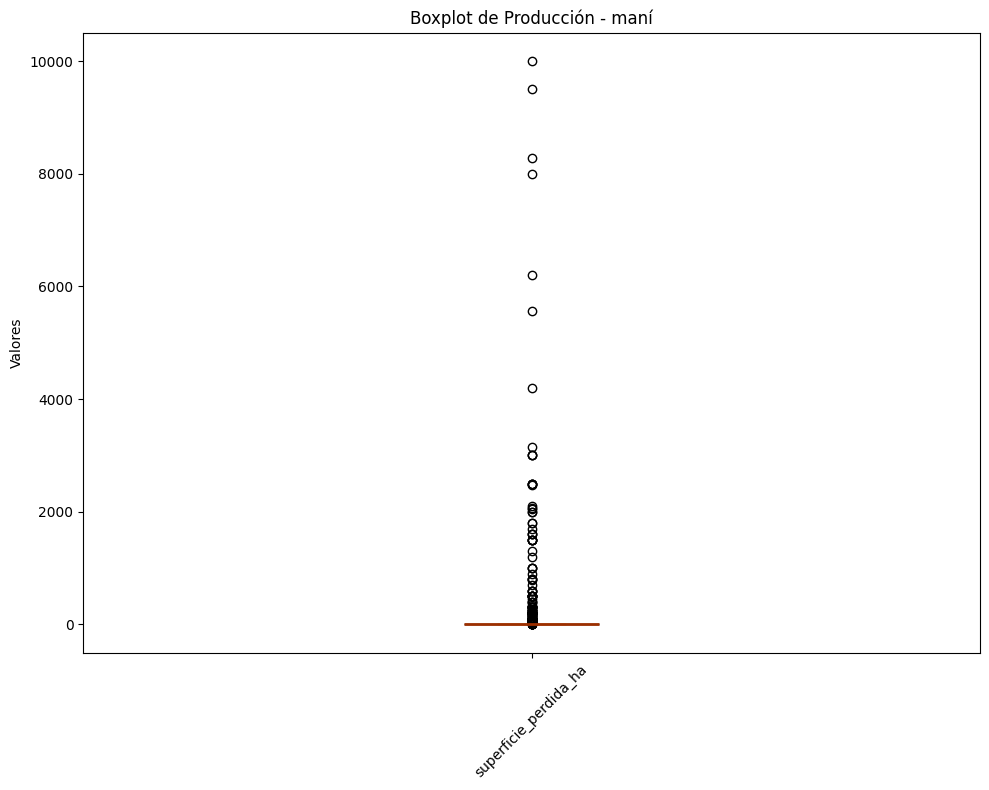

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


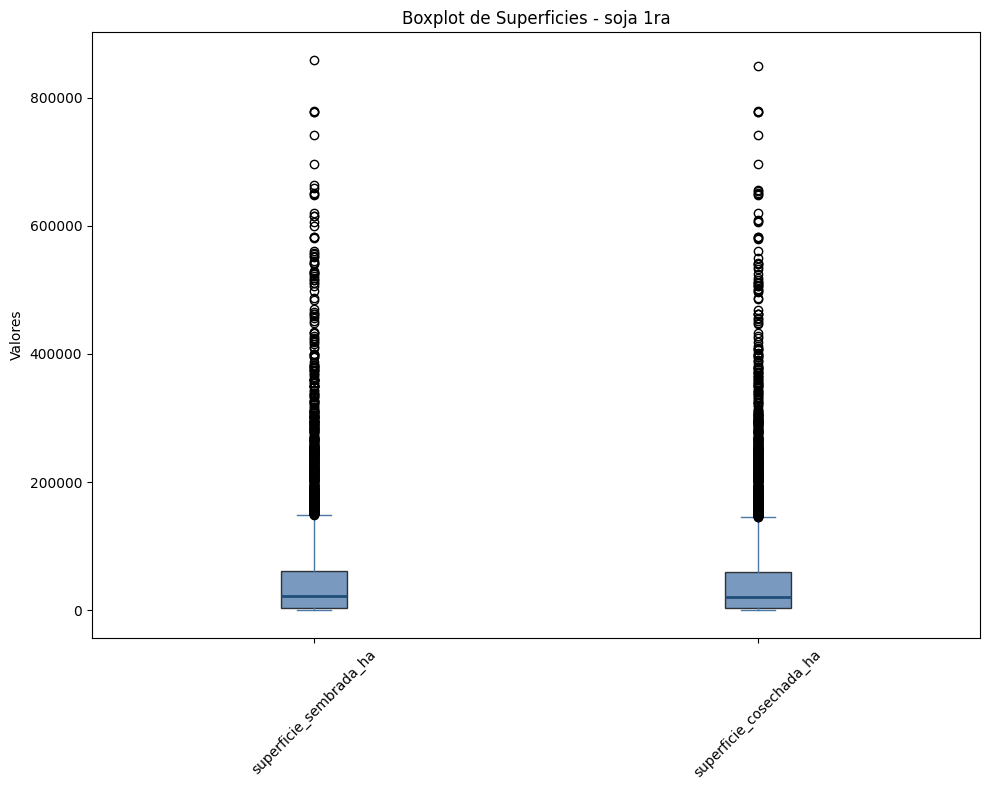

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


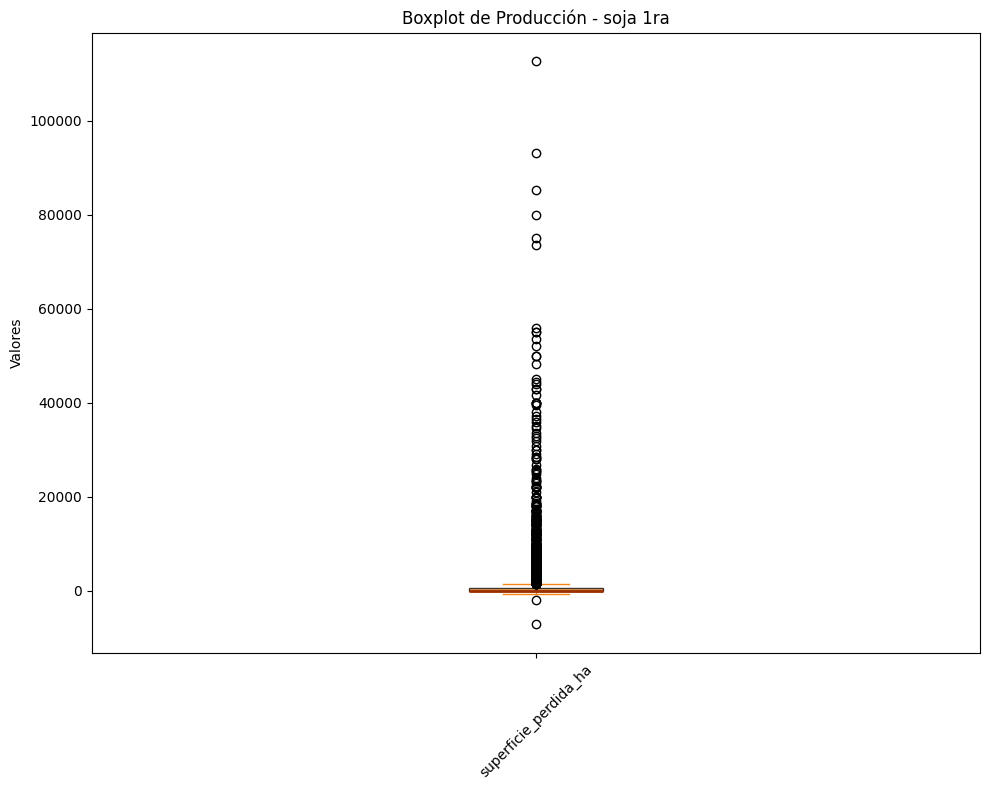

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


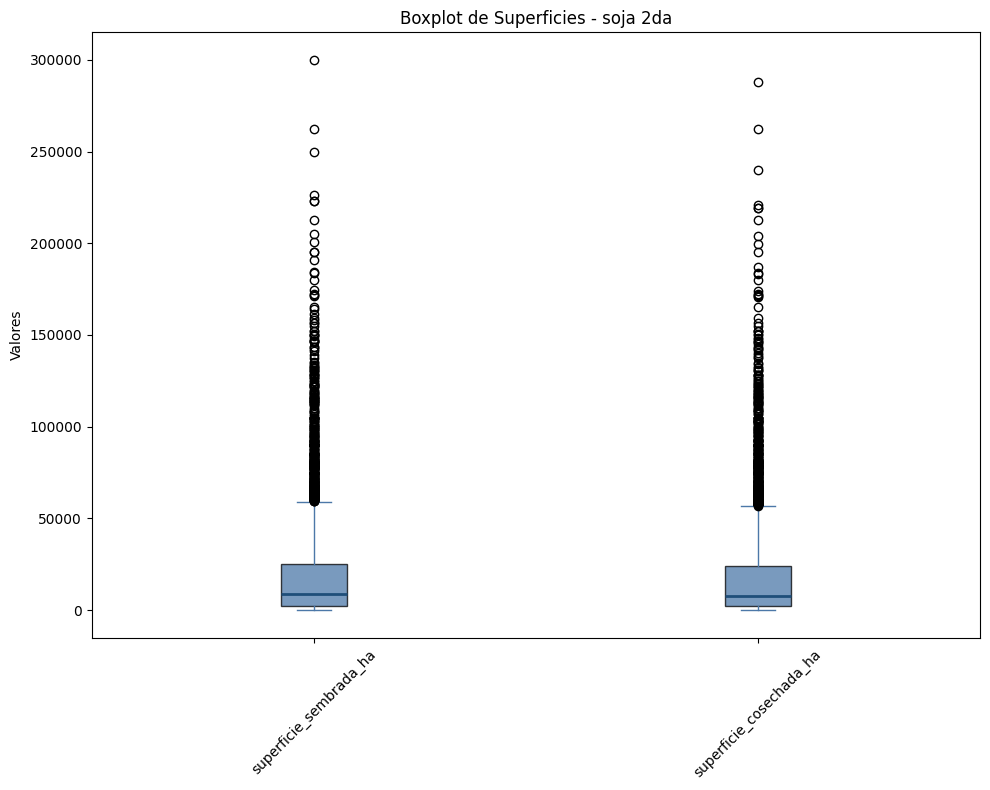

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


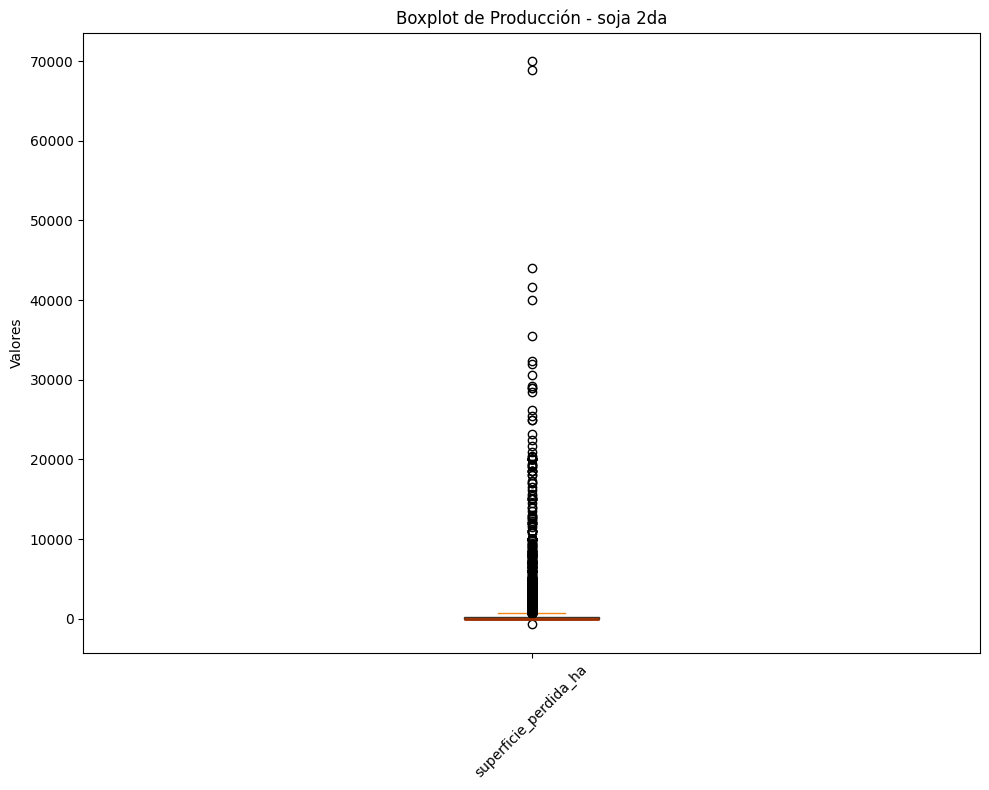

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


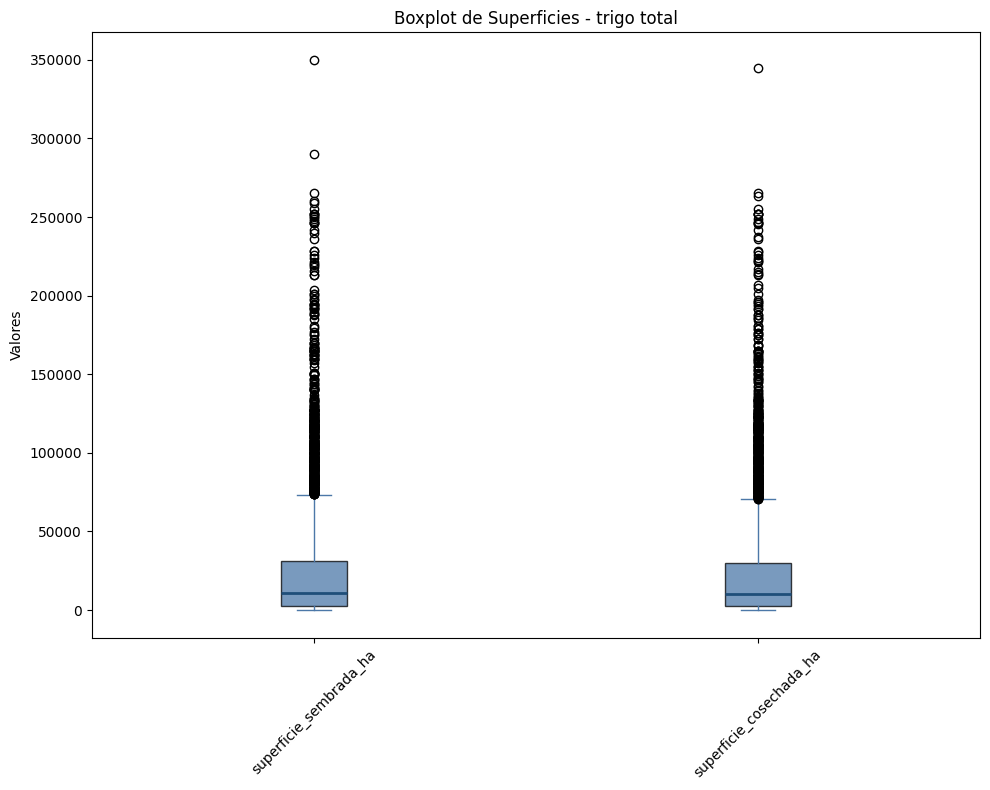

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1749046253.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


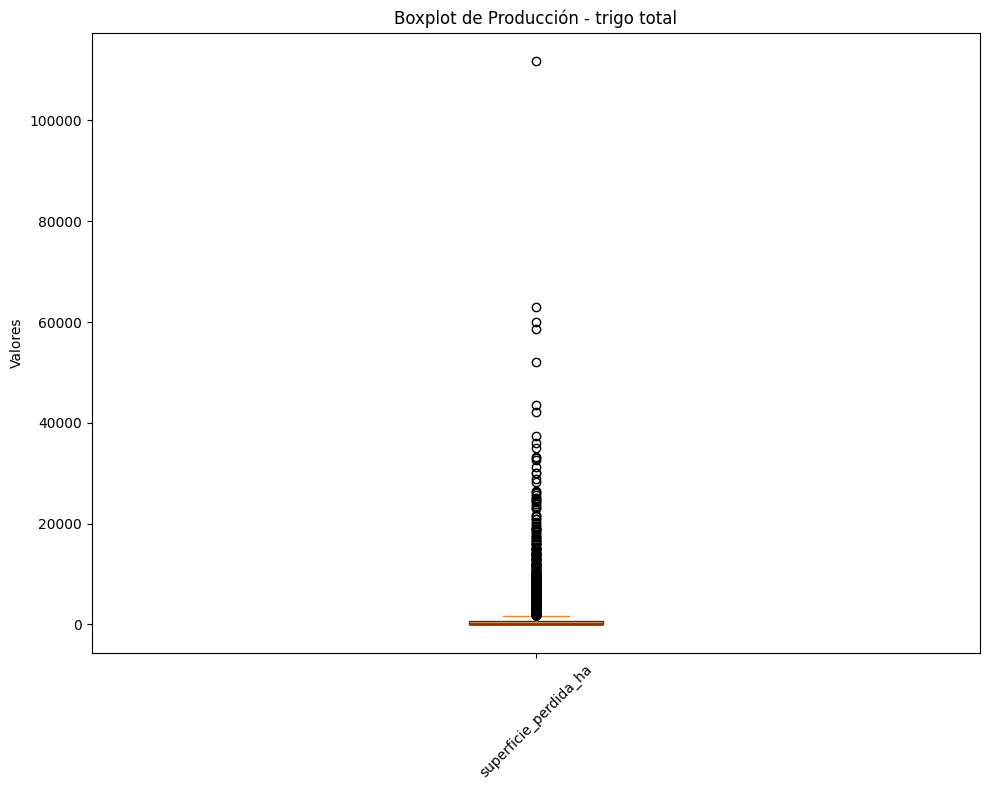

In [35]:
for cultivo in df_camp["cultivo"].dropna().unique():
    df_cultivo = df_camp[df_camp["cultivo"] == cultivo]

    plt.figure(figsize=(10, 8))
    plt.boxplot(
        df_cultivo[["superficie_sembrada_ha", "superficie_cosechada_ha" ]].values,
        labels=["superficie_sembrada_ha", "superficie_cosechada_ha"],
        patch_artist=True,
        boxprops=dict(facecolor="#4C78A8", alpha=0.75),
        medianprops=dict(color="#1F4E79", linewidth=2),
        whiskerprops=dict(color="#4C78A8"),
        capprops=dict(color="#4C78A8")
    )
    plt.title(f"Boxplot de Superficies - {cultivo}")
    plt.ylabel("Valores")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 8))
    plt.boxplot(
        df_cultivo["superficie_perdida_ha"].values,
        labels=["superficie_perdida_ha"],
        patch_artist=True,
        boxprops=dict(facecolor="#F58518", alpha=0.75),
        medianprops=dict(color="#9C2F00", linewidth=2),
        whiskerprops=dict(color="#F58518"),
        capprops=dict(color="#F58518")
    )
    plt.title(f"Boxplot de Producción - {cultivo}")
    plt.ylabel("Valores")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


La exploración de las columnas numéricas nos permite ver que hay una diferencia enre lo sembrado y lo cosechado, esto se puede interpretar como lo perdido. A simple vista vemos que la media no es el valor que mejor representa estas columnas, ya que se observa que los valores máximos de cada columna, se alejan mucho de la media y además hay muchos outliers para cada variable analizada, como indican los boxplots para cada cultivo. Vemos que las desviaciones en cada columna son muy altas también, lo que indica la diferencia de valores para cada columna en cada zona (zonas donde se siembra más, donde el cultivo rinde más, donde se producen más toneladas). Todas las columnas coinciden en lo mismo, su valor mínimo es 0 (inconsistencia aclarada anteriormente).

In [36]:
df = df_camp.copy()
df["departamento"].value_counts()


departamento
Capital       429
9 de Julio    364
Colón         338
Chacabuco     317
Rivadavia     276
             ... 
Los Andes       1
Berisso         1
Minas           1
Rinconada       1
La Poma         1
Name: count, Length: 299, dtype: int64

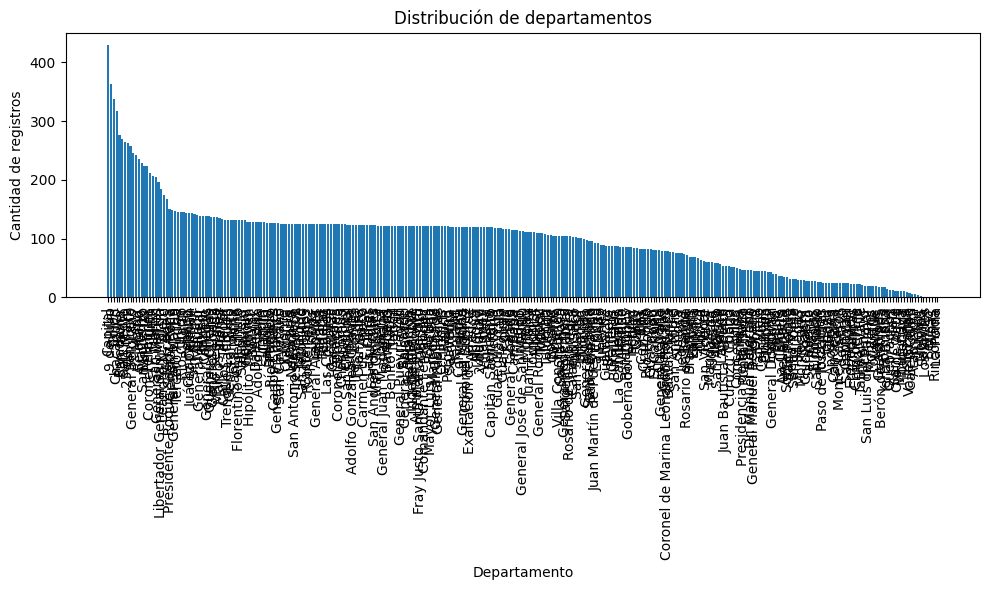

In [37]:
plt.figure(figsize=(10, 6))
conteo_departamentos = df["departamento"].value_counts()
plt.bar(conteo_departamentos.index, conteo_departamentos.values)
plt.title("Distribución de departamentos")
plt.xlabel("Departamento")
plt.ylabel("Cantidad de registros")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


A nivel departamento (no de zona) la distribución de registros es fuertemente asimétrica: 299 nombres de departamento distintos, con un promedio de ~100 registros cada uno pero una mediana de 113 y máximo de 429 (`Capital`), contra un mínimo de 1. Esto no refleja necesariamente la importancia agrícola de cada departamento — varios nombres como `Capital`, `9 de Julio`, `Colón`, `Chacabuco` o `Rivadavia` se repiten en más de una provincia argentina, y acá se están agrupando por nombre, no por `departamento_id`, por lo que ese pico está inflado por la superposición de nombres homónimos entre provincias. El modelo y el resto del pipeline siempre usan `departamento_id` para evitar esta ambigüedad; este gráfico es solo exploratorio.

Además, esta vista todavía no aplica el filtro geográfico de superficie sembrada que se documenta en el notebook 03 (158 de 529 departamentos, ~95% de la superficie sembrada nacional de estos 6 cultivos) — acá se ven los 299 departamentos que registran al menos una siembra de alguno de los 6 cultivos analizados en el período 2000–2024, sin ese recorte todavía aplicado.


In [38]:
df['cultivo'].value_counts()

cultivo
maíz           7171
soja 1ra       6474
trigo total    5788
soja 2da       5111
girasol        4519
maní            822
Name: count, dtype: Int64

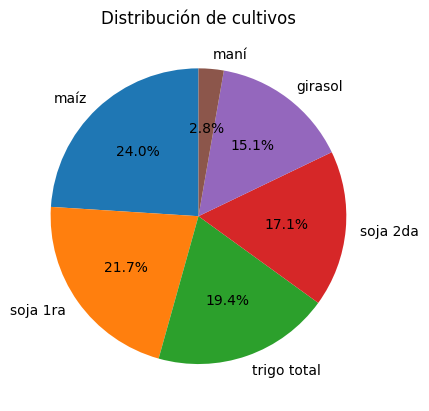

In [39]:
plt.pie(df['cultivo'].value_counts(), labels=df['cultivo'].value_counts().index, autopct='%1.1f%%', startangle=90)
plt.title('Distribución de cultivos')
plt.show()

Observamos que el Trigo y Girasol son los valores con más registros superando por una mínima diferencia a los demás pero como ya vimos, el Girasol cuenta con varios años sin datos, por lo tanto en la siguiente etapa procederemos a verificar la consistencia de esos registros y tomar una decisión de limpieza de datos.

In [40]:
df_clima_filtrado = df_clima[(df_clima['PRECTOTCORR'] > -999.0) * (df_clima['ALLSKY_SFC_SW_DWN'] > 0)]
df_clima_filtrado.describe()

,Fecha,PRECTOTCORR,T2M,T2M_MAX,T2M_MIN,ALLSKY_SFC_SW_DWN,RH2M
count,1538144,1.538144e+06,1.538144e+06,1.538144e+06,1.538144e+06,1.538144e+06,1.538144e+06
mean,2013-04-29 01:16:59.271016960,2.597812e+00,1.751241e+01,2.455979e+01,1.135249e+01,1.755176e+01,6.702915e+01
min,2000-01-01 00:00:00,0.000000e+00,-6.300000e+00,-7.500000e-01,-1.105000e+01,2.700000e-01,9.690000e+00
25%,2006-08-30 00:00:00,0.000000e+00,1.193000e+01,1.865000e+01,6.350000e+00,1.072000e+01,5.643000e+01
50%,2013-04-29 00:00:00,0.000000e+00,1.775000e+01,2.475000e+01,1.137000e+01,1.665000e+01,6.851000e+01
75%,2019-12-28 00:00:00,9.900000e-01,2.299000e+01,3.039000e+01,1.631000e+01,2.466000e+01,7.885000e+01
max,2026-08-28 00:00:00,5.737200e+02,3.941000e+01,4.719000e+01,3.288000e+01,3.624000e+01,9.846000e+01
std,NaN,7.692239e+00,6.985141e+00,7.632109e+00,6.466386e+00,8.461867e+00,1.511156e+01


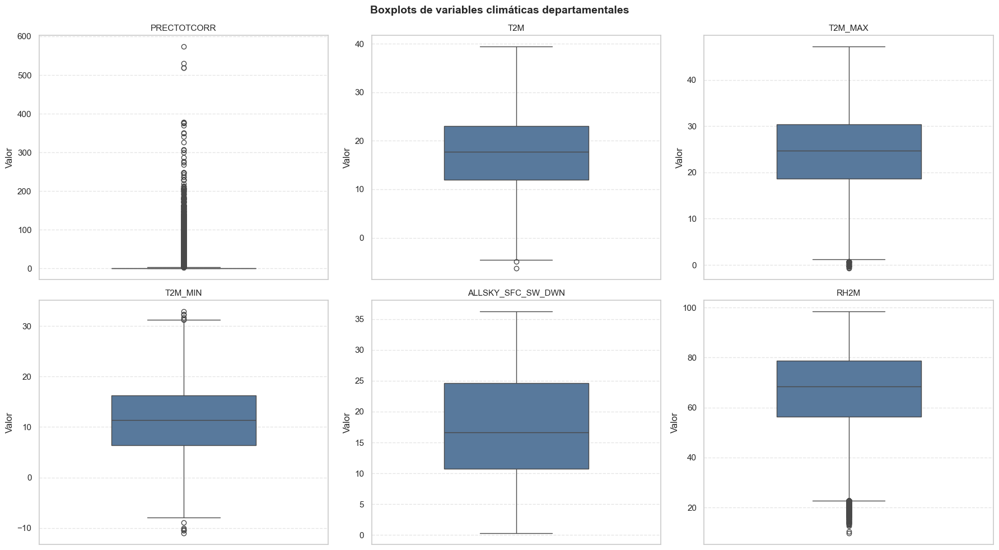

In [41]:
sns.set_theme(style="whitegrid")

cols = [c for c in columnas_clima if c in df_clima_filtrado.columns]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for ax, col in zip(axes, cols):
    sns.boxplot(y=df_clima_filtrado[col].dropna(), color="#4C78A8", width=0.5, ax=ax)
    ax.set_title(col, fontsize=11)
    ax.set_xlabel("")
    ax.set_ylabel("Valor")
    ax.grid(axis="y", linestyle="--", alpha=0.5)

for ax in axes[len(cols):]:
    ax.set_visible(False)

fig.suptitle("Boxplots de variables climáticas departamentales", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

Luego de analizar la tabla de climas, podemos ver que las ditribuciones son bastantes simétricas, la gran mayoría no posee outliers excepto 'PRECTOTCORR' y 'RH2M'. La caja de la primer variable vemos que está bastante aplastada por la cantidad de outliers que existen. En la caja de la columna RH2M podemos ver que si bien hay outliers que vendrían a ser valores que están por debajo de límite inferior, no son tantos como en la otra columna y se puede analizar mejor la caja de esta variable. Las demás poseen una distribución bastante simétrica, sin outliers. Por último vemos que en la xolumna T2M_MIN hay un solo valor como outlier.

In [42]:
df_dolard['Fecha'] = df_dolard['Fecha'].dt.date
df_dolard.describe()

,Divisa Compra
count,7384.000000
mean,186.543709
std,392.099709
min,1.400000
25%,3.753750
50%,14.400000
75%,96.020000
max,1490.500000


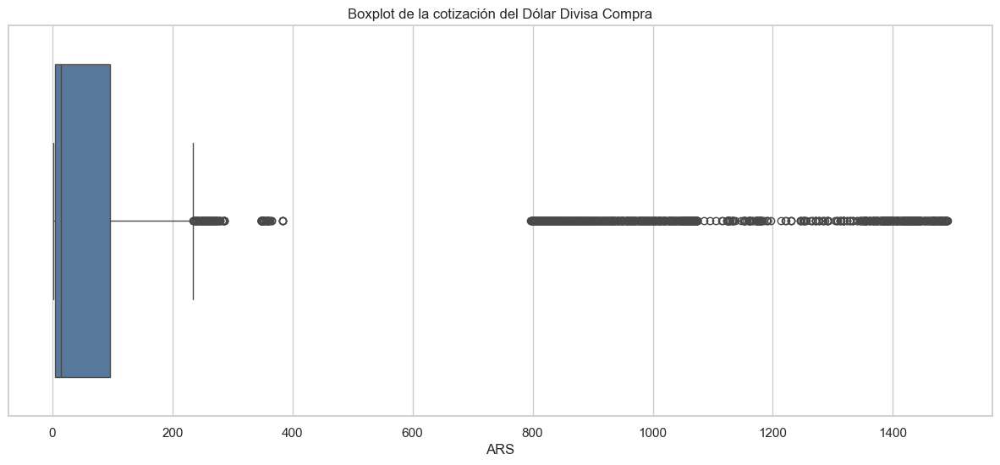

In [43]:
df_dolard['Divisa Compra'] = pd.to_numeric(df_dolard['Divisa Compra'], errors='coerce')

plt.figure(figsize=(15, 6))
sns.boxplot(x='Divisa Compra', data=df_dolard, color='#4C78A8')
plt.title('Boxplot de la cotización del Dólar Divisa Compra')
plt.xlabel('ARS')
plt.show()

Podemos ver como la gran mayoría de los precios están concentrados en un monto inferior a los 150 Pesos argentinos. Todos los valores atípicos son registros reales que aparecen como atípicos por el aumento del precio del Dólar este ultimo tiempo.

In [44]:
for key in dfs_precios.keys():
    print(f"DataFrame: {key}")
    print(round(dfs_precios[key].describe(),2))
    print("-"*50)

DataFrame: precios_girasol
          Precio
count    6000.00
mean    53733.18
std    129580.78
min       250.00
25%       750.00
50%      1850.00
75%     16990.00
max    743250.00
--------------------------------------------------
DataFrame: precios_maiz
          Precio
count    6000.00
mean    28669.66
std     66566.88
min       115.00
25%       388.00
50%       960.00
75%      9165.00
max    293000.00
--------------------------------------------------
DataFrame: precios_soja
          Precio
count    6000.00
mean    49815.67
std    115238.74
min       230.00
25%       805.00
50%      2110.00
75%     15538.75
max    520000.00
--------------------------------------------------
DataFrame: precios_trigo
          Precio
count    6000.00
mean    32608.78
std     73563.59
min       133.20
25%       500.00
50%      1000.00
75%     12862.50
max    333000.00
--------------------------------------------------


C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\823465624.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=labels, y=means, ax=axes[0], palette="Blues_r")
C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\823465624.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=labels, y=stds, ax=axes[1], palette="Oranges_r")


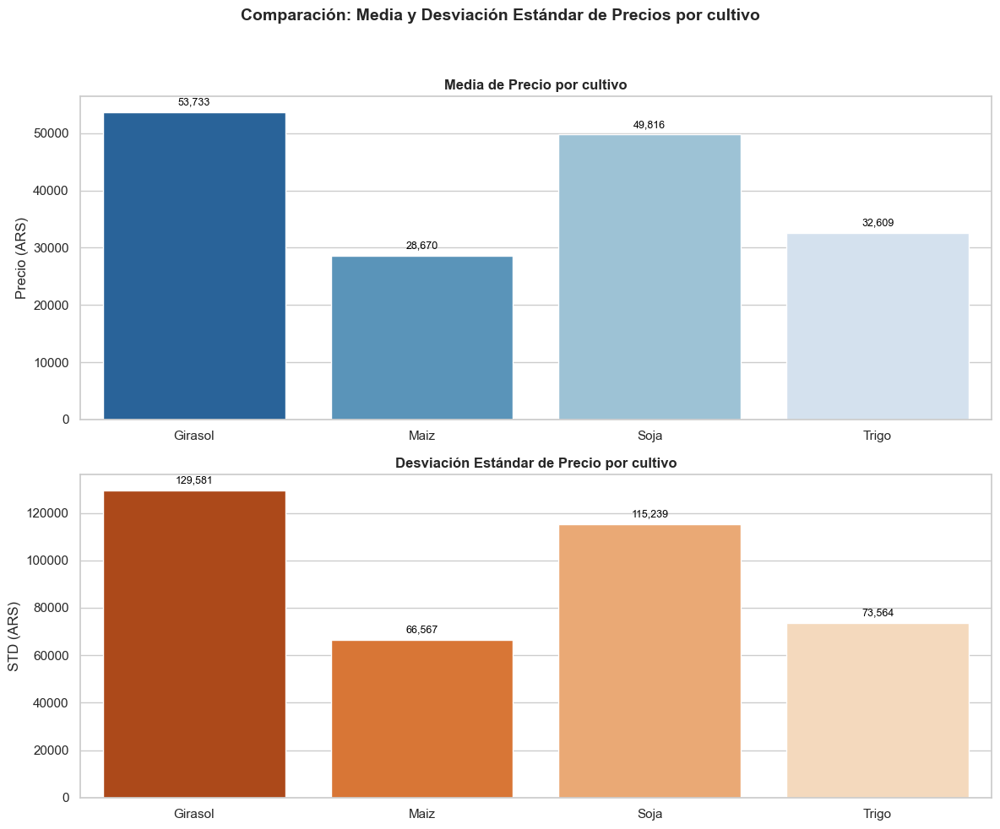

In [45]:


# Bucle para calcular mean y std de cada df en dfs_precios y visualizar en 2 gráficos de barra
labels = []
means = []
stds = []

for key, df_price in dfs_precios.items():
    if df_price.empty:
        continue
    precios = pd.to_numeric(df_price.get("Precio", df_price.iloc[:, -1]), errors="coerce").dropna()
    labels.append(key.replace("precios_", "").capitalize())
    means.append(precios.mean())
    stds.append(precios.std())

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10), constrained_layout=False)

# Gráfico de medias
sns.barplot(x=labels, y=means, ax=axes[0], palette="Blues_r")
axes[0].set_title("Media de Precio por cultivo", fontsize=12, fontweight="bold")
axes[0].set_ylabel("Precio (ARS)")
axes[0].set_xlabel("")
for p in axes[0].patches:
    axes[0].annotate(f"{p.get_height():.0f}", (p.get_x() + p.get_width() / 2, p.get_height()),
                     ha="center", va="bottom", fontsize=9, color="black", xytext=(0, 4), textcoords="offset points")

# Gráfico de desviaciones estándar
sns.barplot(x=labels, y=stds, ax=axes[1], palette="Oranges_r")
axes[1].set_title("Desviación Estándar de Precio por cultivo", fontsize=12, fontweight="bold")
axes[1].set_ylabel("STD (ARS)")
axes[1].set_xlabel("")
for p in axes[1].patches:
    axes[1].annotate(f"{p.get_height():.0f}", (p.get_x() + p.get_width() / 2, p.get_height()),
                     ha="center", va="bottom", fontsize=9, color="black", xytext=(0, 4), textcoords="offset points")

fig.suptitle("Comparación: Media y Desviación Estándar de Precios por cultivo", fontsize=14, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.95])
for ax in axes:
    for t in ax.texts:
        num = re.sub(r"[^\d\.-]", "", t.get_text())
        if num:
            try:
                val = float(num)
                t.set_text(f"{val:,.0f}")
            except:
                pass

plt.show()

El Girasol es el cultivo con el promedio de precios más alto aunque también el que más desviación tiene. La Soja es el segundo de estos cultivos con un promedio casi similar al del Girasol pero una desviación menor que sin embargo sigue siendo bastante alta. El Maíz y el Trigo presentan promedios mucho menores a los dos cultivos anteriores como también desviaciones. Podemos ver que los cuatro cultivos poseen desviaciones mucho más grandes que sus promedios lo cual es un factor a tener en cuenta a la hora de modelar ya que hay varios factores que afectan al cambio de precios por lo tanto habrá que ver el umbral establecido en la fase anterior y pensar si es lógico.

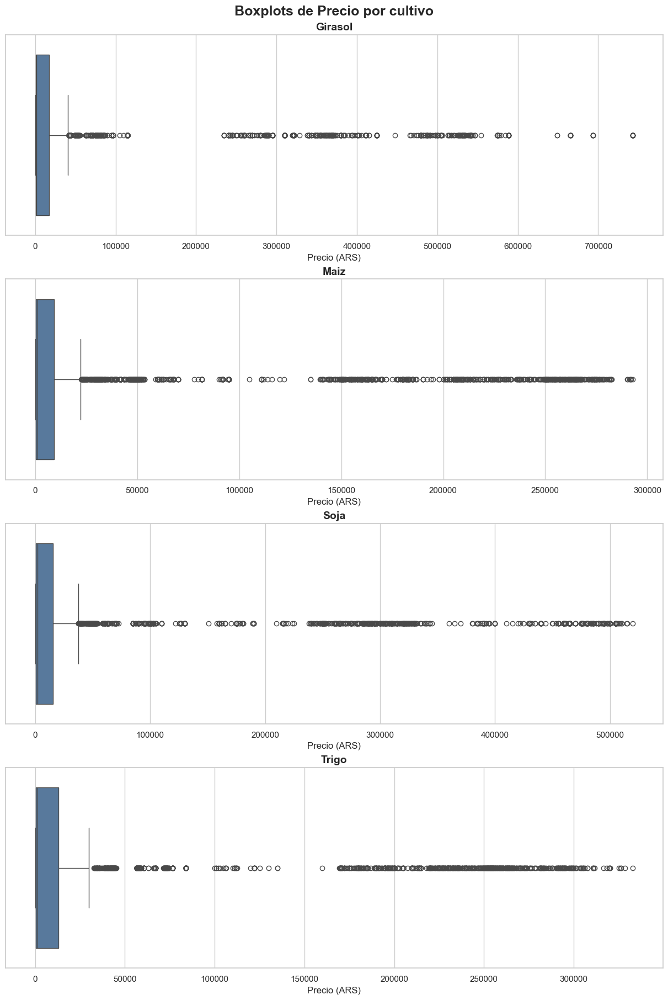

In [46]:
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 18), constrained_layout=True)

for ax, (key, df_price) in zip(axes, dfs_precios.items()):
    cultivo = key.replace("precios_", "").capitalize()
    precios = pd.to_numeric(df_price["Precio"], errors="coerce")

    sns.boxplot(x=precios, ax=ax, color="#4C78A8")
    ax.set_title(f"{cultivo}", fontsize=14, fontweight="bold")
    ax.set_xlabel("Precio (ARS)")
    ax.set_yticks([])

fig.suptitle("Boxplots de Precio por cultivo", fontsize=18, fontweight="bold")
plt.show()

Notamos que la caja de todos los precios está aplastada hacia el principio, dejando fuera del rango de valores típicos a muchos registros que si bien son valores reales, están fuera del rango establecido. Esto demuestra la gran diferencia de valores y cómo fueron cambiando a lo largo de los años.

### 2.5 Exploración bivariada y multivariada

- Exploramos los valores numéricos para cada cultivo. Nos enfocamos en lo sembrado, perdido, cosechado, el rinde y la produccion para ver las diferencias entre cada uno.

- Identificamos el mejor y peor año para cada cultivo

In [47]:
df_crops_filtrados = df[(df["superficie_sembrada_ha"] > 0) & (df["superficie_cosechada_ha"] > 0)].copy()
print(f"cultivos agrícolas analizados: {sorted(df_crops_filtrados['cultivo'].unique())}")
for crop in df_crops_filtrados["cultivo"].unique():
    df_cultivo = df_crops_filtrados[df_crops_filtrados["cultivo"] == crop]
    mejor = df_cultivo.loc[df_cultivo["produccion_tm"].idxmax()]
    peor = df_cultivo.loc[df_cultivo["produccion_tm"].idxmin()]
    print(f"cultivo: {crop}")
    print(f"- Mejor campaña: {mejor['campania']} con {mejor['produccion_tm']} MTn (Departamento: {mejor['departamento']}, ID: {mejor['departamento_id']})")
    print(f"- Peor campaña: {peor['campania']} con {peor['produccion_tm']} MTn (Departamento: {peor['departamento']}, ID: {peor['departamento_id']})")
    print(f"- Promedio de producción: {df_cultivo['produccion_tm'].mean():.2f} MTn")
    print(f"- Desviación estándar de producción: {df_cultivo['produccion_tm'].std():.2f} MTn")
    print(f"- Promedio de rendimiento: {df_cultivo['rendimiento_kgxha'].mean():.2f} kg/Ha")
    print(f"- Desviación estándar de rendimiento: {df_cultivo['rendimiento_kgxha'].std():.2f} kg/Ha")
    print("-" * 50)


cultivos agrícolas analizados: ['girasol', 'maní', 'maíz', 'soja 1ra', 'soja 2da', 'trigo total']
cultivo: girasol
- Mejor campaña: 2007/2008 con 321300 MTn (Departamento: Necochea, ID: 06581)
- Peor campaña: 2006/2007 con 0 MTn (Departamento: Hucal, ID: 42077)
- Promedio de producción: 19451.75 MTn
- Desviación estándar de producción: 32078.82 MTn
- Promedio de rendimiento: 1976.34 kg/Ha
- Desviación estándar de rendimiento: 545.57 kg/Ha
--------------------------------------------------
cultivo: maíz
- Mejor campaña: 2020/2021 con 3412500 MTn (Departamento: Río Cuarto, ID: 14098)
- Peor campaña: 2008/2009 con 0 MTn (Departamento: Chicligasta, ID: 90021)
- Promedio de producción: 118872.68 MTn
- Desviación estándar de producción: 263115.23 MTn
- Promedio de rendimiento: 5604.30 kg/Ha
- Desviación estándar de rendimiento: 2264.98 kg/Ha
--------------------------------------------------
cultivo: maní
- Mejor campaña: 2013/2014 con 399000 MTn (Departamento: General Roca, ID: 14035)
- Peo

**Producción y rendimiento de cultivos:**

- **Maíz** y **Soja 1ra** tuvieron su mejor campaña en producción en **Río Cuarto** (Córdoba): maíz en 2020/2021 (3.412.500 t) y soja 1ra en 2015/2016 (2.550.819 t). Río Cuarto es, de hecho, el departamento con mayor superficie histórica sembrada de ambos cultivos (ver 2.6).
- **Trigo total** tuvo su mejor campaña en **General López** (Santa Fe), en 2021/2022 (1.063.118 t) — el mismo departamento que lidera la superficie histórica sembrada de Soja 2da.
- **Girasol** tuvo su mejor campaña en **Necochea** (Buenos Aires), en 2007/2008 (321.300 t).
- **Maní** tuvo su mejor campaña en **General Roca** (Córdoba), en 2013/2014 (399.000 t) — dentro del cinturón manisero núcleo.
- **Soja 2da** tuvo su mejor campaña en **San Justo** (Córdoba), en 2014/2015 (979.200 t).
- Para las peores campañas, los seis cultivos tienen múltiples departamentos y campañas empatados en 0 toneladas producidas (pérdida total pese a sembrar y cosechar superficie > 0) — el ejemplo que devuelve `idxmin` es arbitrario entre esos empates y no debe leerse como "el peor departamento", sino como una muestra de que la pérdida total no es un evento raro en el dataset.


In [48]:
sns.set_theme(style="whitegrid")
cols = [c for c in ["PRECTOTCORR", "T2M", "T2M_MAX", "T2M_MIN", "ALLSKY_SFC_SW_DWN", "RH2M"] if c in df_clima_filtrado.columns]
departamentos = sorted(df_clima_filtrado["Departamento"].dropna().unique())
n_cols = 1
n_rows = int(np.ceil(len(departamentos) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5.5 * n_rows), squeeze=False)
axes = axes.flatten()
for ax, departamento in zip(axes, departamentos):
    departamento_df = df_clima_filtrado[df_clima_filtrado["Departamento"] == departamento][cols]
    melted = departamento_df.melt(var_name="Variable", value_name="Valor")
    sns.boxplot(data=melted, x="Variable", y="Valor", hue="Variable", ax=ax, width=0.6, fliersize=4, legend=False)
    ax.set_title(f"Departamento: {departamento}", fontsize=12, fontweight="bold")
    ax.set_xlabel("Variable climática")
    ax.set_ylabel("Valor")
    ax.grid(axis="y", linestyle="--", alpha=0.5)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
for ax in axes[len(departamentos):]:
    ax.set_visible(False)
fig.suptitle("Boxplots de variables climáticas por departamento", fontsize=16, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

Luego de analizar cada variable en cada departamento descubrimos que el patrón es similar al análisis realizado para las variables sin agrupar por departamento: la variable PRECTOTCORR presenta muchos outliers dejando la caja prácticamente aplastada y mostrando el sesgo de los datos, la variable RH2M presenta outliers también aunque en menor cantidad y no en todos los departamentos. Las demás variables no presentan outliers prácticamente, solo en algunos departamentos, y poseen una distribución bastante simétrica.


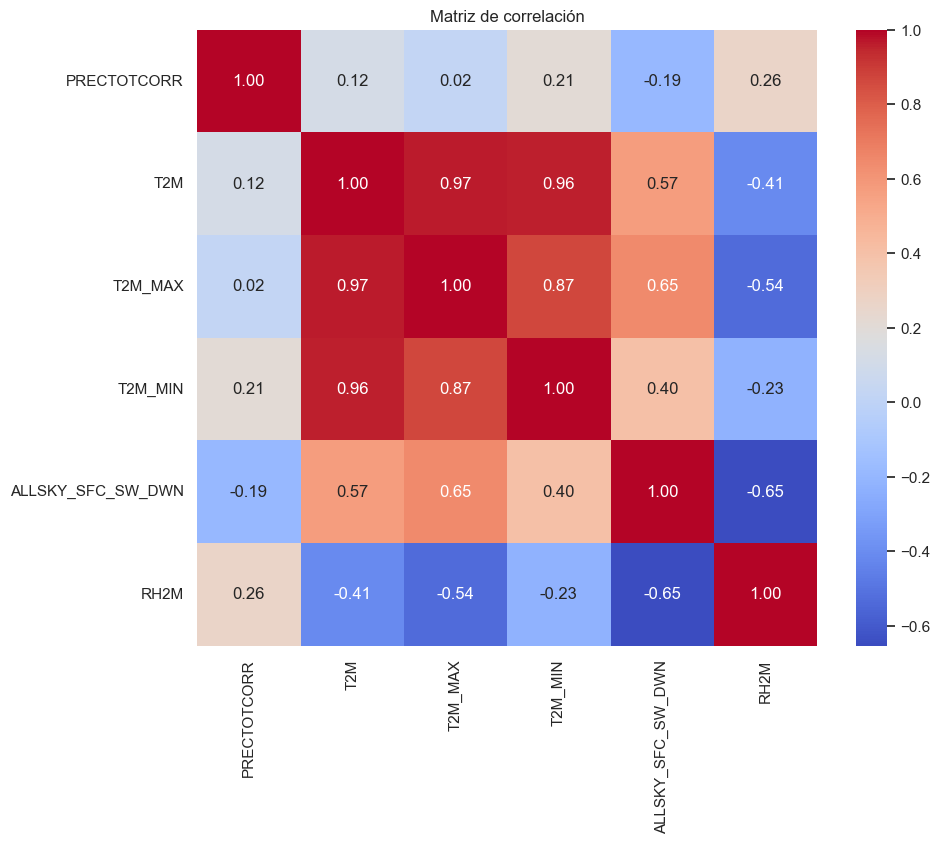

In [49]:
corr = df_clima_filtrado[cols].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de correlación')
plt.show()

Este gráfico nos permite ver las relaciones entre las variables. Como se observa, T2M está altamente relacionada con T2M_MAX y T2M_MIN, y estas dos entre ellas, ya que representan la condición térmica del mismo día en el mismo lugar. También observamos una relación moderada entre ALLSKY_SFC_SW_DWN y T2M_MAX, ya que a mayor radiación, mayor temperatura. Por este mismo patrón, ALLSKY_SFC_SW_DWN también tiene una relación moderada con T2M. Las demás relaciones que se observan son débiles; se puede destacar la relación negativa moderada entre ALLSKY_SFC_SW_DWN y RH2M, la más baja de las negativas. Por último, se observa multicolinealidad entre las variables de temperatura, es decir, dos o más variables muy relacionadas entre sí, lo que puede generar redundancia a la hora de entrenar modelos predictivos. En la próxima etapa se evaluará la posibilidad de usar solo T2M o crear una nueva variable de amplitud térmica (T2M_MAX − T2M_MIN) en su lugar.


### 2.6 Exploración temporal
- Evolución del rendimiento por departamento a lo largo de las campañas
- Estacionalidad y tendencia en el clima
- Identificación de campañas atípicas (sequías, heladas, shocks de precio)


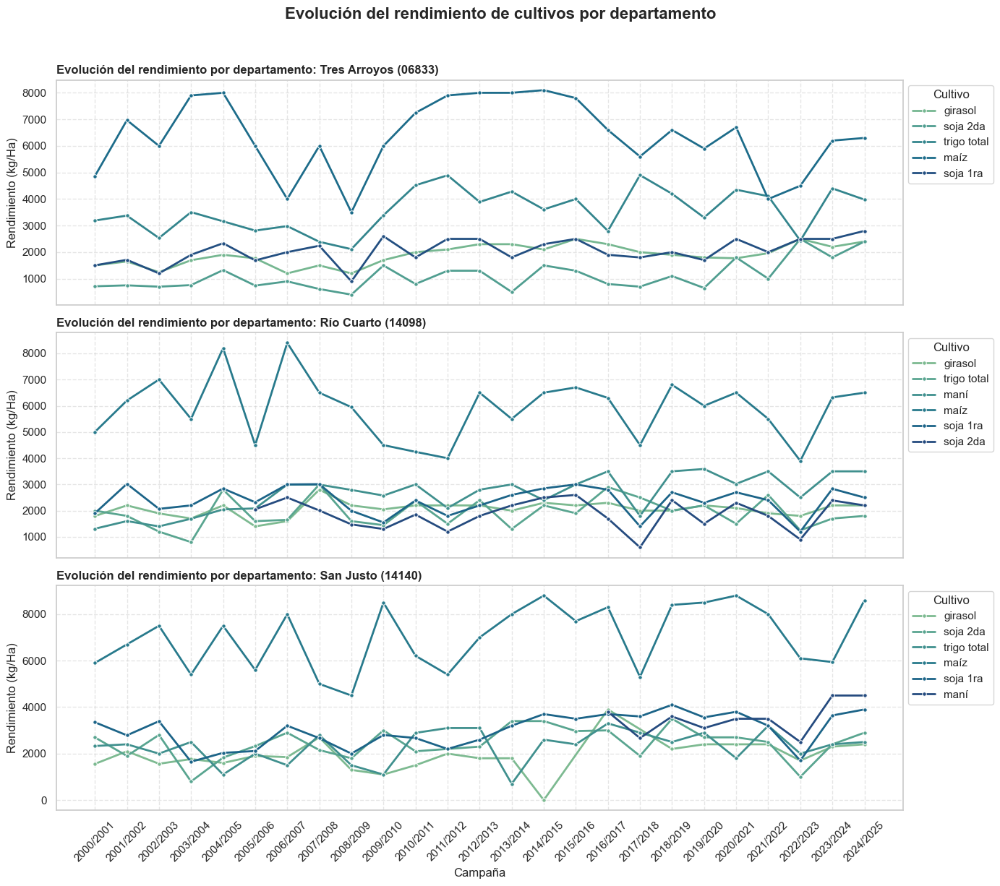

In [50]:
df["anio_inicio"] = df["campania"].str.split("/").str[0].astype(int)
df = df.sort_values(by="anio_inicio", ascending=True)
siembra = df.groupby(["cultivo", "departamento_id", "departamento"], as_index=False)["superficie_sembrada_ha"].sum()
departamentos_temporales = (siembra.sort_values(["cultivo", "superficie_sembrada_ha", "departamento_id"], ascending=[True, False, True]).drop_duplicates("cultivo")["departamento_id"].drop_duplicates().tolist())
fig, axes = plt.subplots(nrows=len(departamentos_temporales), ncols=1, figsize=(14, 4 * len(departamentos_temporales)), sharex=True)
if len(departamentos_temporales) == 1:
    axes = [axes]
for i, departamento_id in enumerate(departamentos_temporales):
    ax = axes[i]
    departamento_df = df[df["departamento_id"] == departamento_id].sort_values("anio_inicio")
    departamento = departamento_df["departamento"].iloc[0]
    sns.lineplot(data=departamento_df, x="campania", y="rendimiento_kgxha", hue="cultivo", palette="crest", linewidth=2, marker="o", markersize=4, ax=ax, sort=False)
    ax.set_title(f"Evolución del rendimiento por departamento: {departamento} ({departamento_id})", fontsize=12, fontweight="bold", loc="left")
    ax.set_ylabel("Rendimiento (kg/Ha)")
    ax.tick_params(axis="x", rotation=45)
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.legend(title="Cultivo", loc="upper left", bbox_to_anchor=(1, 1))
plt.xlabel("Campaña")
fig.suptitle("Evolución del rendimiento de cultivos por departamento", fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

**Hallazgos:**

Se calculó el rendimiento promedio simple entre departamentos por campaña y cultivo (`rendimiento_kgxha`, sin ponderar por superficie) para verificar si las campañas de sequía documentadas históricamente siguen viéndose en el dataset a nivel departamento. Las caídas interanuales (campaña vs. la anterior) para los seis cultivos son:

- **2008/2009** (sequía 2008/2009): girasol -26,5%, maíz -26,5%, soja 1ra -38,8%, soja 2da -35,1%, trigo -23,6%, maní -15,4%. La caída más generalizada y pareja de las cuatro campañas revisadas — todos los cultivos caen a la vez.
- **2011/2012** (La Niña, sequía en zona núcleo): la caída es más moderada y concentrada en soja (1ra -15,8%, 2da -15,6%) y girasol (-13,5%); maíz (-6,6%) y trigo (-6,1%) casi no se mueven, y maní queda prácticamente plano (-0,7%). Esto matiza el relato histórico de "mermas importantes" en maíz para esta campaña puntual: en los datos departamentales la merma de maíz es la más chica de las cuatro sequías analizadas.
- **2017/2018** (inundaciones + sequía severa): caída fuerte en soja 2da (-36,1%) y soja 1ra (-23,3%), y en maíz (-18,2%) y maní (-17,2%); trigo (-2,3%) y girasol (-1,5%) casi no se ven afectados, consistente con que el evento fue de verano (ciclo grueso) y no golpeó a los cultivos de invierno.
- **2022/2023** (triple Niña, la sequía más severa del período): es la caída más pareja y profunda del dataset — trigo -32,0%, soja 2da -35,6%, soja 1ra -31,5%, maíz -19,8%, maní -19,2%, girasol -6,3%. A diferencia de 2008/2009, acá el trigo (cultivo de invierno) también se ve golpeado con fuerza, algo consistente con que esa sequía se extendió sobre varias campañas consecutivas.

Estas cuatro campañas fueron efectivamente las de peor desempeño relativo del período 2000–2024 para la mayoría de los cultivos, lo que confirma a nivel departamento el patrón que ya se conocía a nivel zona. La magnitud exacta de la caída sí cambia cultivo por cultivo respecto al relato histórico genérico: no todas las sequías golpean por igual a todos los cultivos, y esto es información que el modelo climático por etapa fenológica (notebook 03) debería poder capturar mejor que un promedio anual.


### Evolución temporal del clima por departamento

Se seleccionan departamentos existentes en los archivos cargados para analizar tendencias y estacionalidad sin hardcodear nombres ni IDs.

C:\Users\Manuel Lombardi\AppData\Local\Temp\ipykernel_13492\1759905980.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clima_filtrado["Fecha"] = pd.to_datetime(df_clima_filtrado["Fecha"], errors="coerce")


Departamentos seleccionados para STL por máxima superficie sembrada:
    cultivo departamento_id departamento  superficie_sembrada_ha
    girasol           06833 Tres Arroyos                 2170868
       maní           14098   Río Cuarto                 2001171
       maíz           14098   Río Cuarto                 8593747
   soja 1ra           14098   Río Cuarto                13926252
   soja 2da           14140    San Justo                 3485932
trigo total           06833 Tres Arroyos                 3972493


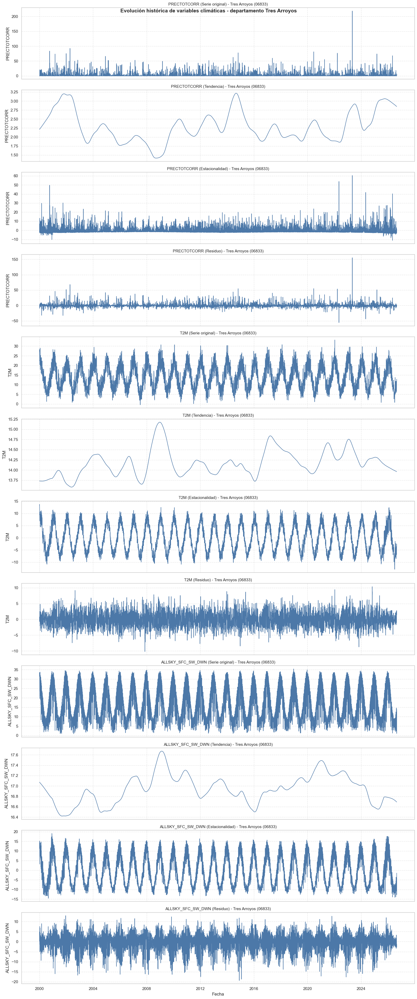

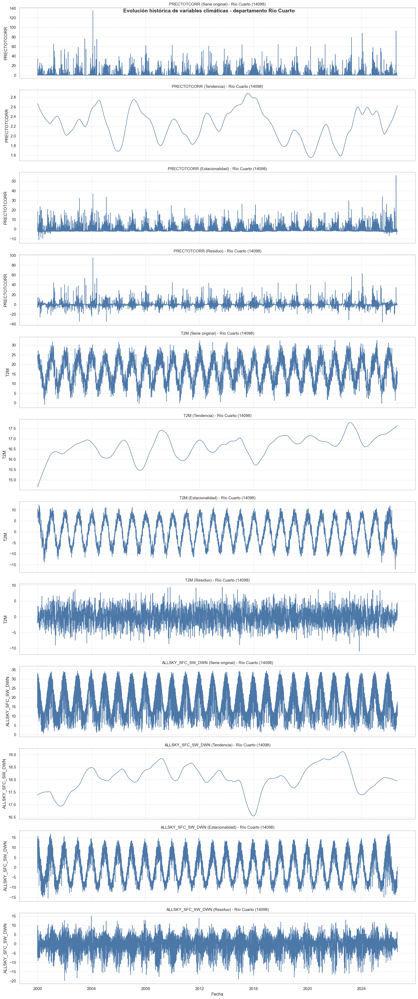

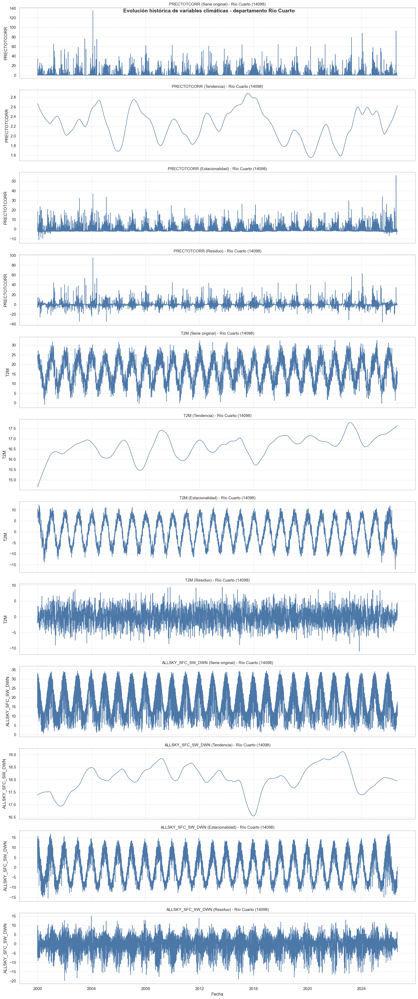

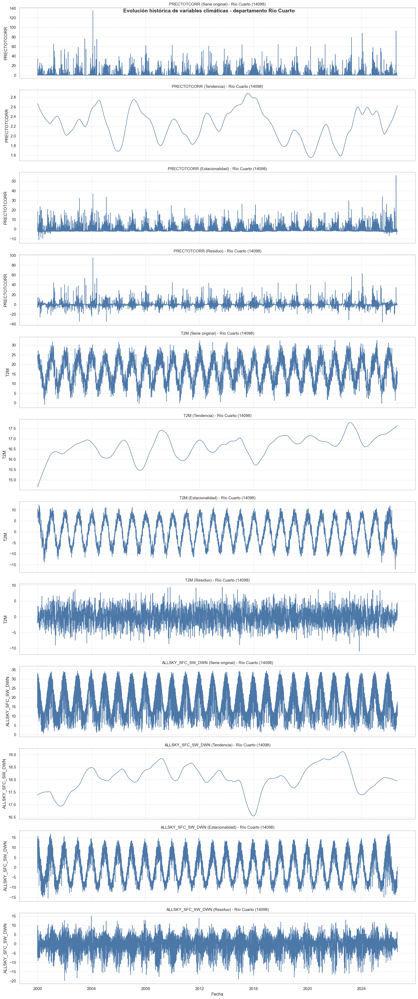

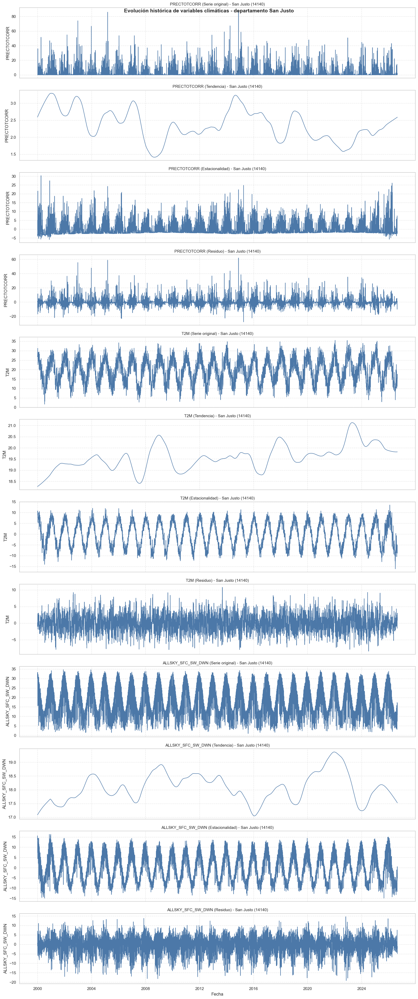

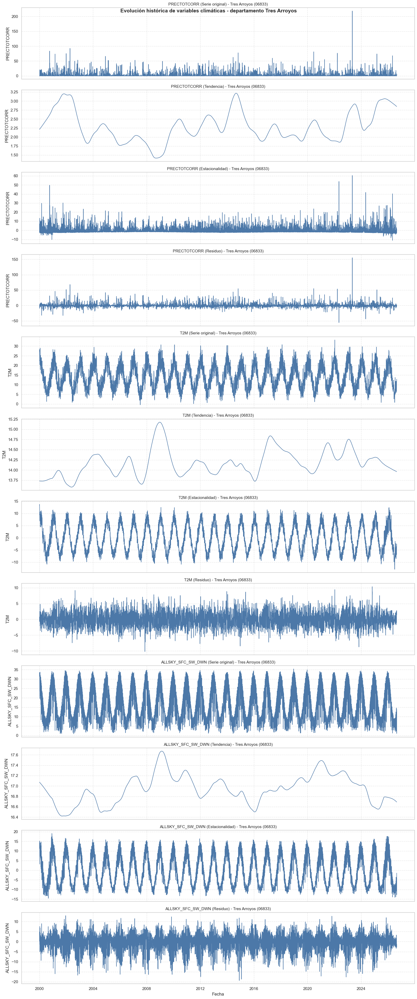

In [51]:
sns.set_theme(style="whitegrid")
df_clima_filtrado["Fecha"] = pd.to_datetime(df_clima_filtrado["Fecha"], errors="coerce")
df_clima_filtrado = df_clima_filtrado.dropna(subset=["Fecha"])
variables = [c for c in ["PRECTOTCORR", "T2M", "ALLSKY_SFC_SW_DWN"] if c in df_clima_filtrado.columns]
siembra_por_departamento = df_camp.groupby(["cultivo", "departamento_id", "departamento"], as_index=False)["superficie_sembrada_ha"].sum()
seleccion_stl = siembra_por_departamento.sort_values(["cultivo", "superficie_sembrada_ha", "departamento_id"], ascending=[True, False, True]).drop_duplicates("cultivo", keep="first").sort_values("cultivo")
ids_departamentos_stl = seleccion_stl["departamento_id"].tolist()
print("Departamentos seleccionados para STL por máxima superficie sembrada:")
print(seleccion_stl.to_string(index=False))
for departamento_id in ids_departamentos_stl:
    departamento_df = df_clima_filtrado[df_clima_filtrado["Departamento_id"] == departamento_id].sort_values("Fecha")
    if departamento_df.empty:
        print(f"Sin datos climáticos para el departamento {departamento_id}; se omite.")
        continue
    departamento = departamento_df["Departamento"].iloc[0]
    fig, axes = plt.subplots(nrows=len(variables) * 4, ncols=1, figsize=(16, 3.2 * len(variables) * 4), sharex=True)
    for i, var in enumerate(variables):
        datos_serie = departamento_df.groupby("Fecha")[var].mean().dropna()
        if len(datos_serie) < 4:
            continue
        resultado = STL(datos_serie, period=min(365, max(2, len(datos_serie) // 2))).fit()
        componentes = [(datos_serie, "Serie original"), (resultado.trend, "Tendencia"), (resultado.seasonal, "Estacionalidad"), (resultado.resid, "Residuo")]
        for j, (serie_comp, titulo) in enumerate(componentes):
            ax = axes[i * 4 + j]
            ax.plot(serie_comp.index, serie_comp.values, linewidth=1.2, color="#4C78A8")
            ax.set_title(f"{var} ({titulo}) - {departamento} ({departamento_id})", fontsize=11)
            ax.set_ylabel(var)
            ax.grid(True, linestyle="--", alpha=0.5)
    axes[-1].set_xlabel("Fecha")
    fig.suptitle(f"Evolución histórica de variables climáticas - departamento {departamento}", fontsize=14, fontweight="bold")
    plt.tight_layout()
plt.show()

**Criterio de selección para STL**

La descomposición STL no se ejecuta sobre los 158 departamentos climáticos. Para mantener una lectura comparable y enfocada, se suma `superficie_sembrada_ha` por `cultivo × departamento` y se selecciona el departamento con mayor superficie sembrada acumulada (2000–2024) para cada uno de los seis cultivos analizados: Girasol, Maíz, Maní, Soja 1ra, Soja 2da y Trigo total.

Con los datos actuales los líderes son **Río Cuarto** (Córdoba) para Maíz, Maní y Soja 1ra — el mismo departamento lidera tres de los seis cultivos —, **Tres Arroyos** (Buenos Aires) para Girasol y Trigo total, y **San Justo** (Córdoba) para Soja 2da. Al haber solapamiento, se obtienen **tres** departamentos únicos, no seis.

**Interpretación climática**

La estacionalidad de T2M y ALLSKY_SFC_SW_DWN sigue el ciclo anual, con valores más altos en verano y menores durante el invierno. Las tendencias y residuos deben interpretarse dentro de los departamentos seleccionados por predominancia agrícola, no como una conclusión nacional ni como una representación de todos los departamentos.

Las precipitaciones presentan eventos extremos en distintos momentos de las series. Estos picos se conservarán como señales potencialmente útiles para construir variables climáticas por campaña en el notebook 03.

**Implicancia para el notebook 03**

Las variables climáticas deberán agregarse por `Departamento_id`, campaña y ventana fenológica. La selección de estos tres departamentos se utiliza únicamente para esta exploración STL y no debe convertirse en un filtro permanente de los datos climáticos.


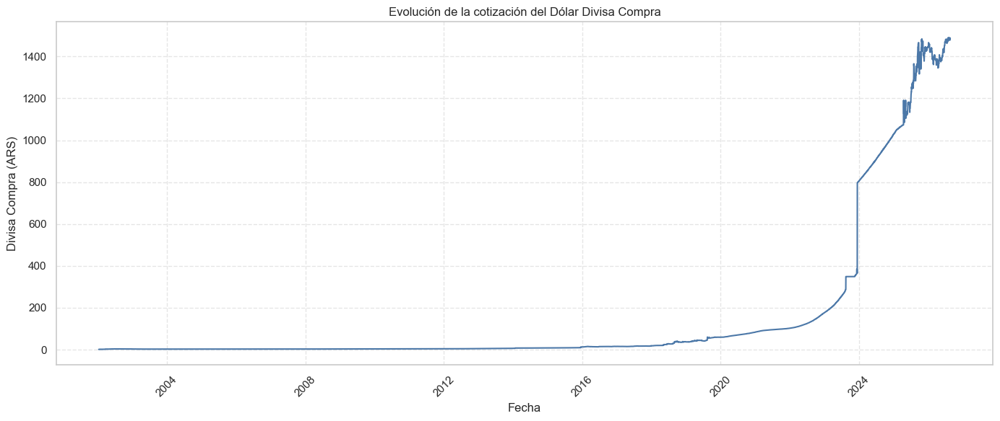

In [52]:
df_dolard['Fecha'] = pd.to_datetime(df_dolard['Fecha'], errors='coerce').dt.date
df_dolard = df_dolard.sort_values('Fecha')

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_dolard, x='Fecha', y='Divisa Compra', color='#4C78A8')
plt.title('Evolución de la cotización del Dólar Divisa Compra')
plt.xlabel('Fecha')
plt.ylabel('Divisa Compra (ARS)')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

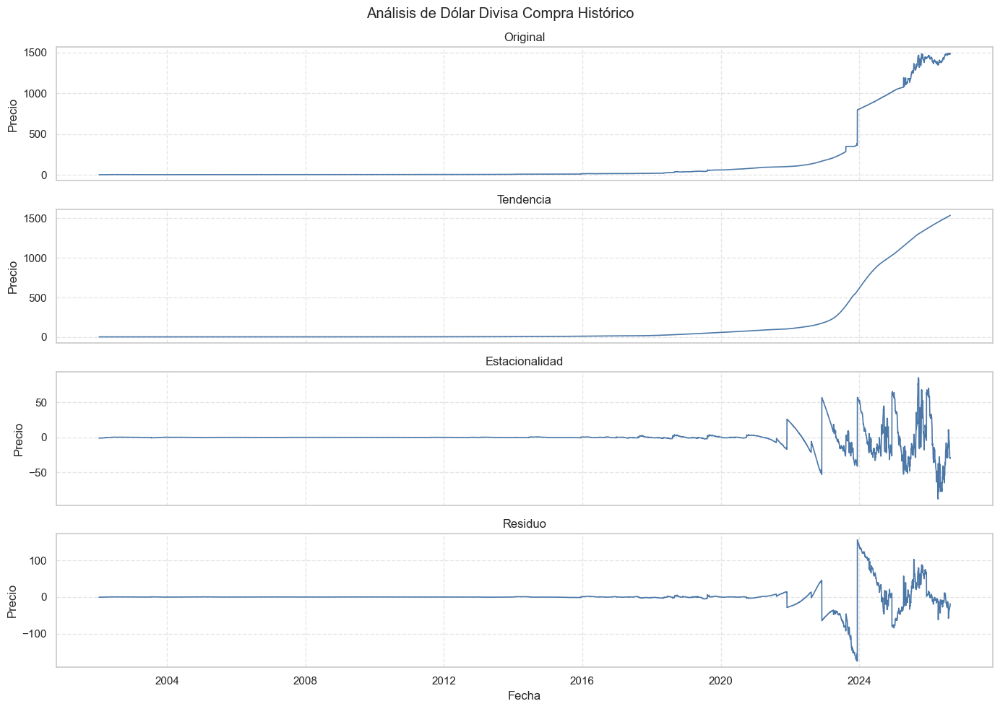

In [53]:
dolar_stl = STL(df_dolard.groupby(by='Fecha')['Divisa Compra'].mean(), period=365)
dolar_stl_graph = dolar_stl.fit()
figsize=(14, 10)
fig, axes = plt.subplots(4, 1, figsize=figsize, sharex=True)
components = [
        (dolar_stl_graph.observed, "Original"),
        (dolar_stl_graph.trend, "Tendencia"),
        (dolar_stl_graph.seasonal, "Estacionalidad"),
        (dolar_stl_graph.resid, "Residuo"),
]
        
fig.suptitle("Análisis de Dólar Divisa Compra Histórico")

for i, (ax, (comp, title)) in enumerate(zip(axes, components)):
            ax.plot(comp.index, comp.values, color="#4C78A8", linewidth=1.2)
            ax.set_title(title)
            ax.set_ylabel("Precio")  # Agrega "Precio" al eje Y de cada gráfico
            ax.grid(True, linestyle="--", alpha=0.5)
            
            # Agrega "Fecha" solo al último gráfico para no repetir el texto
            if i == len(axes) - 1:
                ax.set_xlabel("Fecha")

        
plt.tight_layout()
plt.show()


**Gráfico original:**
- Observamos la subida en la cotización a fines del 2023, marcando una gran diferencia a comparación de los precios de los otros años y alcanzando el pico máximo alrededor de los 1500 pesos. Entendiendo el contexto, podemos decir que los precios aumentaron casi más del triple (un 300%) en aproximadamente poco más de un año. Antes de eso, la línea indica que el precio va aumentando pero poco a poco, sin cambios brutos.

**Tendencia:**
- En este gráfico podemos ver cómo se comporta el Dólar Divisa Compra, mientras más pasas el tiempo, mayor es su precio, al principio se nota una meseta que parece indicar que el precio se mantiene pero en realidad siempre va subiendo, por más mínimo que sea el aumento.

**Estacionalidad:**
- El gráfico muestra una distorsión en la línea a partir del año 2016 aunque recién luego del 2020 es cuando más se deforma. En esta parte podemos ver que no hay una estacionalidad clara, lo cual demuestra la variabilidad e inestabilidad de la economía argentina. Se puede observar un pico máximo en 2025 aproximadamente, luego de ahí baja y llega a un mínimo histórico.

**Residuos:**
- Como mencionamos anteriormente, después del 2020 se empiezan a notar los cambios en el gráfico y en este caso podemos ver la cantidad de valores atípicos que hay entre 2023 y 2025, donde la línea alcanza un mínimo y un máximo completamente lejanos, más de 100 unidades de diferencia.

**Implicancia:**
- Dado a la alta volatilidad en el precio a causa de la inflación, se confirma la decisión de convertir el precio de los cultivos a dólares usando estos valores, para más estabilidad. En caso de no hacer esto, se crearía un problema a la hora de modelar el modelo A, encargado de predecir los precios.

In [54]:
dfs_precios_dolar = {}

for key, df_price in dfs_precios.items():
    df_temp = df_price.copy()

    # Determinar la columna de fecha
    fecha_col = None
    for candidate in ['Fecha de operación', 'Fecha']:
        if candidate in df_temp.columns:
            fecha_col = candidate
            break

    if fecha_col is None:
        raise ValueError(f"No se encontró columna de fecha en el DataFrame {key}")

    df_temp[fecha_col] = pd.to_datetime(df_temp[fecha_col], errors='coerce')
    df_temp['Fecha'] = df_temp[fecha_col].dt.date

    if 'Precio' not in df_temp.columns:
        posibles = [c for c in df_temp.columns if 'precio' in c.lower()]
        if posibles:
            df_temp.rename(columns={posibles[0]: 'Precio'}, inplace=True)
        else:
            raise ValueError(f"No se encontró columna de precio en el DataFrame {key}")

    df_temp['Precio'] = pd.to_numeric(df_temp['Precio'], errors='coerce')

    df_merged = df_temp.merge(
        df_dolard[['Fecha', 'Divisa Compra']],
        on='Fecha',
        how='left'
    )

    df_merged['Precio en USD'] = df_merged['Precio'] / df_merged['Divisa Compra']

    df_result = df_merged[['Fecha', 'Precio', 'Divisa Compra', 'Precio en USD']].copy()
    dfs_precios_dolar[key] = df_result

    var_name = "df_precios_dolar_" + "".join(ch if ch.isalnum() else "_" for ch in key)
    globals()[var_name] = df_result

    print(f"{key} -> filas: {len(df_result)} ; variable: {var_name}")

precios_girasol -> filas: 6000 ; variable: df_precios_dolar_precios_girasol
precios_maiz -> filas: 6000 ; variable: df_precios_dolar_precios_maiz
precios_soja -> filas: 6000 ; variable: df_precios_dolar_precios_soja
precios_trigo -> filas: 6000 ; variable: df_precios_dolar_precios_trigo


In [55]:
for key, df_price_dolar in dfs_precios_dolar.items():
    print(f"DataFrame: {key}")
    print(df_price_dolar.head())
    print("-"*50)

DataFrame: precios_girasol
        Fecha  Precio  Divisa Compra  Precio en USD
0  2002-01-02   250.0            NaN            NaN
1  2002-01-11   250.0           1.40     178.571429
2  2002-01-14   250.0           1.40     178.571429
3  2002-01-15   250.0           1.45     172.413793
4  2002-01-16   250.0           1.80     138.888889
--------------------------------------------------
DataFrame: precios_maiz
        Fecha  Precio  Divisa Compra  Precio en USD
0  2002-01-02   115.0            NaN            NaN
1  2002-01-11   115.0           1.40      82.142857
2  2002-01-14   115.0           1.40      82.142857
3  2002-01-15   115.0           1.45      79.310345
4  2002-01-16   115.0           1.80      63.888889
--------------------------------------------------
DataFrame: precios_soja
        Fecha  Precio  Divisa Compra  Precio en USD
0  2002-01-02   230.0            NaN            NaN
1  2002-01-11   230.0           1.40     164.285714
2  2002-01-14   230.0           1.40     16

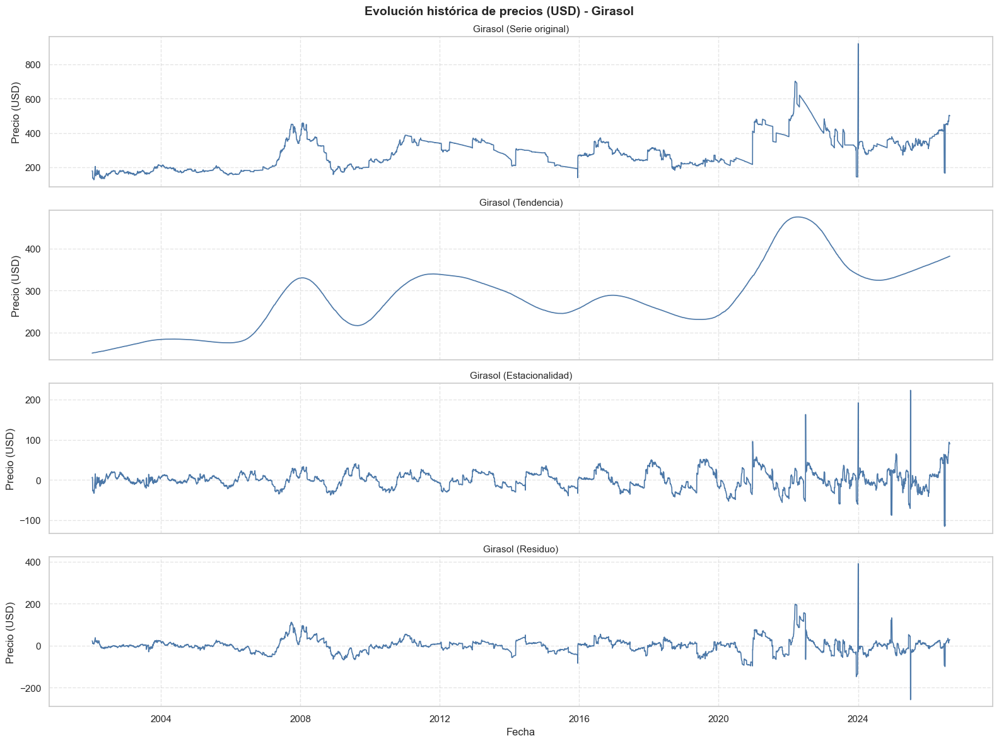

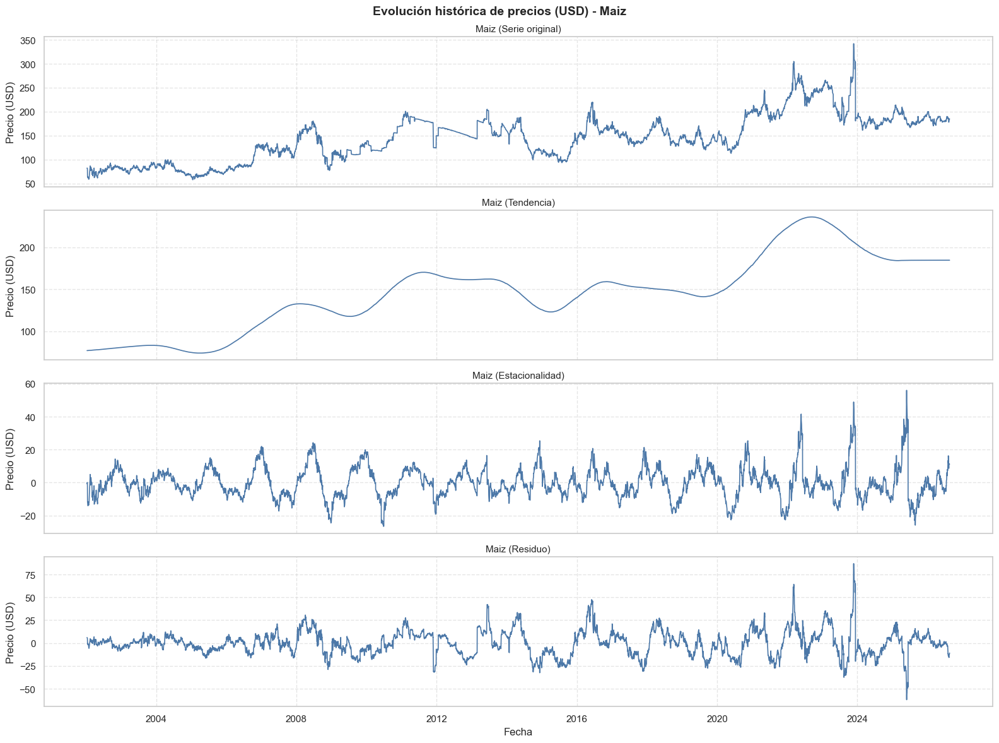

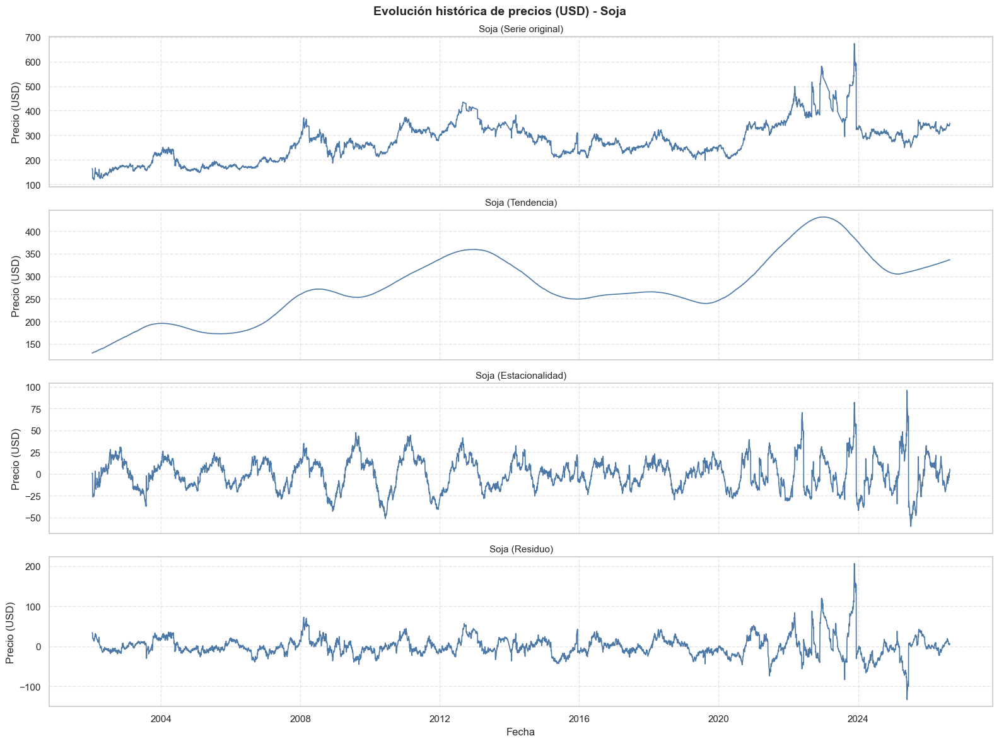

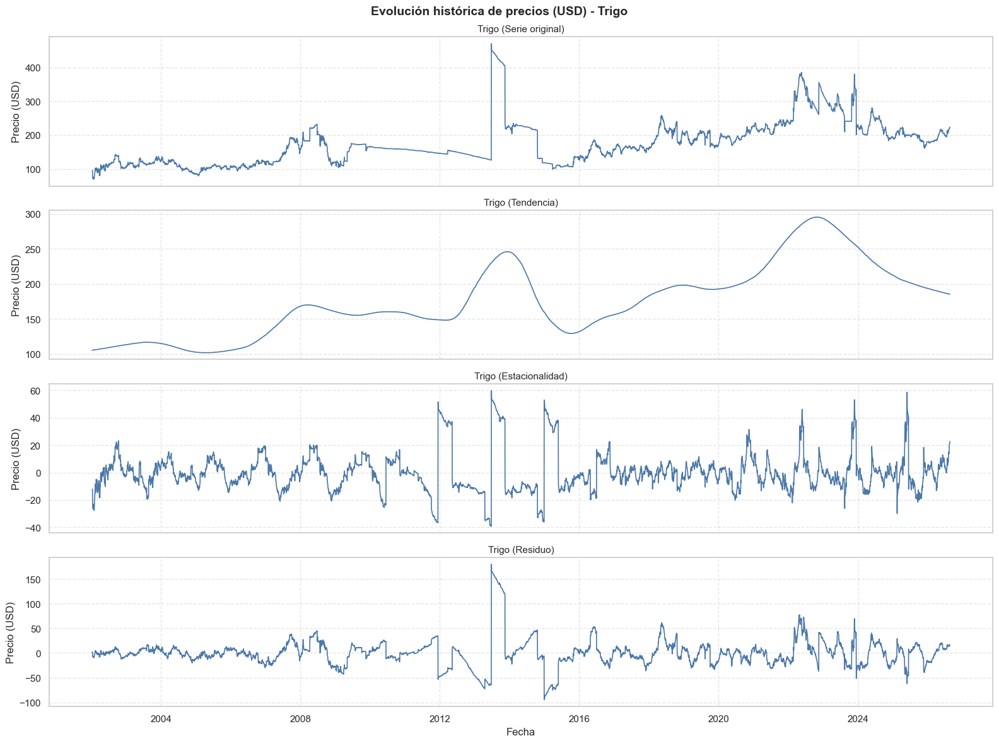

In [56]:
sns.set_theme(style="whitegrid")

for crop_key, df_price in dfs_precios_dolar.items():
    # Preparar la serie de precios
    precio_df = df_price.copy()
    precio_df["Fecha"] = pd.to_datetime(precio_df["Fecha"], errors="coerce")
    precio_df["Precio"] = pd.to_numeric(precio_df["Precio"], errors="coerce")

    precio_df = (
        precio_df.dropna(subset=["Fecha", "Precio en USD"])
        .sort_values("Fecha")
        .groupby("Fecha", as_index=False)["Precio en USD"]
        .mean()
    )

    if precio_df.empty:
        continue

    serie_precio = precio_df.set_index("Fecha")["Precio en USD"].astype(float)

    if len(serie_precio) < 4:
        continue

    period = min(365, max(2, len(serie_precio) // 2))
    stl = STL(serie_precio, period=period)
    resultado = stl.fit()

    componentes = [
        (serie_precio, "Serie original"),
        (resultado.trend, "Tendencia"),
        (resultado.seasonal, "Estacionalidad"),
        (resultado.resid, "Residuo"),
    ]

    crop_name = crop_key.replace("precios_", "").capitalize()

    fig, axes = plt.subplots(
        nrows=4,
        ncols=1,
        figsize=(16, 12),
        sharex=True
    )

    for ax, (serie_comp, titulo) in zip(axes, componentes):
        ax.plot(serie_comp.index, serie_comp.values, color="#4C78A8", linewidth=1.2)
        ax.set_title(f"{crop_name} ({titulo})", fontsize=11)
        ax.set_ylabel("Precio (USD)")
        ax.grid(True, linestyle="--", alpha=0.5)

    axes[-1].set_xlabel("Fecha")
    fig.suptitle(f"Evolución histórica de precios (USD) - {crop_name}", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

**Girasol**
* **Tendencia:** Muestra ciclos alcistas marcados con un pico histórico muy fuerte cerca de 2022 (típicamente asociado a disrupciones globales), seguido de una corrección y una leve recuperación reciente.
* **Estacionalidad:** Presenta un patrón anual constante y bien definido. Para tus ventanas de predicción de 30 a 90 días, este será uno de los predictores automáticos más fuertes que el algoritmo podrá capturar.
* **Residuos:** Hay alta volatilidad en los residuos justo durante los picos de precio. Esto indica que la serie es muy sensible a shocks externos; cuando el precio se dispara, ni la tendencia histórica ni la época del año logran explicarlo por sí solos.

**Maíz**
* **Tendencia:** Refleja un crecimiento más suavizado a lo largo del tiempo, con los superciclos de materias primas (2012 y 2022) presentes pero menos erráticos que en otros cultivos.
* **Estacionalidad:** Es extremadamente regular, con picos y valles muy consistentes año a año. Como el maíz tiene ventanas de siembra y comercialización muy específicas, el modelo de machine learning debería mapear esta estacionalidad casi a la perfección para pronósticos a corto plazo.
* **Residuos:** Al igual que el girasol, los picos de error no explicados (ruido) se agrupan en momentos de crisis o eventos climáticos severos, manteniéndose bastante estables el resto del tiempo.

**Soja**
* **Tendencia:** Es una serie que marca fuertemente el compás del mercado, con valles prolongados (como el periodo 2016-2019) y picos muy agresivos. Actualmente la tendencia se muestra corrigiendo a la baja, pero en un escalón de precios superior al de la década de 2000.
* **Estacionalidad:** Un detalle vital aquí es la "amplitud". Si observas el gráfico, los ciclos estacionales son mucho más amplios en términos de dólares absolutos hoy que en 2004. El modelo necesitará entender esta varianza (quizás convenga aplicar una transformación logarítmica a la serie antes de entrenar).
* **Residuos:** Son considerables a partir de 2020. Para predecir a 90 días con precisión en este entorno, el modelo va a depender de que las variables puedan absorber esta gran variabilidad reciente.

**Trigo**
* **Tendencia y Serie Original:** Es la gráfica más atípica de las cuatro. Presenta caídas verticales dramáticas (muy notables alrededor de 2013 y 2014), seguidas de periodos de líneas completamente rectas. Esto es un claro indicio de anomalías en los datos de origen: pueden ser imputaciones por falta de cotizaciones, baches de iliquidez en el mercado local o intervenciones/cierres de registro de exportación.
* **Estacionalidad:** Aunque el patrón matemático la detecta, se ve algo distorsionada y forzada por las anomalías estructurales de la serie original.
* **Residuos:** Son los más extremos de todos. Los picos en el gráfico de residuos coinciden exactamente con los cortes abruptos de la serie original. 

**Recomendaciones para el desarrollo del modelo:**
* Para las predicciones a **30 y 60 días**, el componente de estacionalidad es la señal más limpia. Algoritmos especializados en series temporales capturarán esto rápidamente.
* Para predecir a **90 días o más**, el peso recae sobre la tendencia. Sin embargo, como todos los cultivos presentan picos de residuos gigantescos en los mismos años (2008, 2012, 2022), un modelo netamente univariado (que solo mire el precio pasado) va a fallar ante un "cisne negro". Incorporamemos variables exógenas (datos climáticos).
* **Atención especial al Trigo:** Esas líneas rectas y saltos van a confundir enormemente a la función de pérdida (loss function) del modelo. Sería ideal aplicar una limpieza de datos específica para esos periodos, ya sea suavizando la interpolación o creando una variable dummy (0 o 1) que le indique al algoritmo que en esas fechas ocurrió un evento de mercado anómalo.

In [57]:
import types
from pathlib import Path


out_dir = Path("../data/processed")
out_dir.mkdir(parents=True, exist_ok=True)

# Individual dataframes to save
to_save = {
    "df_clima_filtrado": df_clima_filtrado,
    "df_dolard": df_dolard,
    "df_crops_filtrados": df_crops_filtrados,
    "df": df
}

for name, df_obj in to_save.items():
    if isinstance(df_obj, pd.DataFrame):
        (out_dir / f"{name}.csv").write_text("")  # ensure write permission on some FS
        df_obj.to_csv(out_dir / f"{name}.csv", index=False)
    else:
        print(f"Skipping {name}: not a DataFrame")

# dfs_precios_dolar is a dict of DataFrames -> save each with a safe filename
for key, df_price in dfs_precios_dolar.items():
    if not isinstance(df_price, pd.DataFrame):
        print(f"Skipping {key}: not a DataFrame")
        continue
    safe_key = "".join(ch if ch.isalnum() or ch in ("_", "-") else "_" for ch in key)
    df_price.to_csv(out_dir / f"{safe_key}_usd.csv", index=False)

print(f"Saved CSVs to {out_dir.resolve()}")

Saved CSVs to C:\Users\Manuel Lombardi\OneDrive\Escritorio\crops-yield-price-forecast\data\processed


### 2.7 Hallazgos preliminares

### Conclusiones de Data Understanding

La variabilidad de siembra, cosecha, pérdidas, producción y rendimiento se analiza por departamento, cultivo y campaña. Las diferencias entre departamentos justifican conservar `departamento_id` como clave geográfica y no usar el nombre aislado (dos departamentos de distinta provincia pueden compartir nombre, como se vio en la sección 2.4).

El conjunto agrícola incorpora Girasol, Maíz, Maní, Soja 1ra, Soja 2da y Trigo total — Soja 1ra y Soja 2da se tratan como dos cultivos distintos, no como el agregado `soja total` del archivo. Los valores cero, faltantes, duplicados de clave e inconsistencias lógicas se identifican para su tratamiento posterior y no se eliminan automáticamente.

Los datos climáticos se cargan automáticamente desde `data/raw/clima_departamentos/`. Cada archivo se valida contra su `Departamento_id`, y sus variables se analizan por departamento y fecha. La cobertura climática no coincide con la cobertura agrícola: de los 347 departamentos agrícolas, solo 158 tienen clima descargado (sección 2.3) — ese recorte a 158 departamentos, que concentran ~95% de la superficie sembrada nacional de estos 6 cultivos, se aplica y se documenta formalmente recién en el notebook 03.

El Track A de precios conserva únicamente los cuatro cultivos con archivos de precios disponibles (Girasol, Maíz, Soja, Trigo). Maní no se incluye en precios porque el proyecto no dispone de una serie real para ese cultivo.
